# Employee Performance Analysis

## Data Analysis Requirement :

# The types of Job Levels are : 

In [13]:
data.EmpJobRole.value_counts()

Sales Executive              270
Developer                    236
Manager R&D                   94
Research Scientist            77
Sales Representative          69
Laboratory Technician         64
Senior Developer              52
Manager                       51
Finance Manager               49
Human Resources               45
Technical Lead                38
Manufacturing Director        33
Healthcare Representative     33
Data Scientist                20
Research Director             19
Business Analyst              16
Senior Manager R&D            15
Delivery Manager              12
Technical Architect            7
Name: EmpJobRole, dtype: int64

# Insights :

### These are the types of the job that the people have accordingly to their years of experience.

# Report on selecting ML algoritms and Data processing techniques :

In [248]:
from sklearn.model_selection import GridSearchCV

param_grids = {
    'Logistic Regression': {'C': [0.1, 1, 10]},
    'Decision Tree': {'max_depth': [None, 5, 10, 20]},
    'Random Forest': {'n_estimators': [50, 100, 200], 'max_depth': [None, 5, 10]},
    'GradientBoostingCl': {'n_estimators': [50, 100, 200], 'max_depth': [3, 5, 7]}
}

best_params_train = {}
for model_name, model in models.items():
    grid_search = GridSearchCV(estimator=model, param_grid=param_grids[model_name], scoring='accuracy', cv=5)
    grid_search.fit(x_train_pca, y_train)
    best_params_train[model_name] = grid_search.best_params_

tuned_models_train = {name: model.set_params(**params) for name, model, params in zip(models.keys(), models.values(), best_params_train.values())}

results_train_tuned = {}
for model_name, model in tuned_models_train.items():
    cv_results = cross_validate(model, x_train_pca, y_train, cv=5, scoring=scoring)
    results_train_tuned[model_name] = {
        metric: cv_results[f'test_{metric}'].mean() for metric in scoring
    }

results_test_tuned = {}
for model_name, model in tuned_models_train.items():
    cv_results = cross_validate(model, x_test_pca, y_test, cv=5, scoring=scoring)
    results_test_tuned[model_name] = {
        metric: cv_results[f'test_{metric}'].mean() for metric in scoring
    }

Models_df_train_tuned = pd.DataFrame(results_train_tuned).T
Models_df_test_tuned = pd.DataFrame(results_test_tuned).T

print("Train Dataset Results for Tuned Models:")
print(Models_df_train_tuned)

print("\nTest Dataset Results for Tuned Models:")
print(Models_df_test_tuned)

difference_tuned = Models_df_test_tuned - Models_df_train_tuned
print("\nDifference between Train and Test Dataset Results for Tuned Models:")
print(difference_tuned)


Train Dataset Results for Tuned Models:
                     Accuracy  Precision    Recall  F1 Score
Logistic Regression  0.856149   0.855525  0.856155  0.854170
Decision Tree        0.851243   0.851728  0.851228  0.848890
Random Forest        0.957115   0.958286  0.957106  0.956689
GradientBoostingCl   0.948434   0.950273  0.948430  0.947699

Test Dataset Results for Tuned Models:
                     Accuracy  Precision    Recall  F1 Score
Logistic Regression  0.805556   0.739941  0.675971  0.693529
Decision Tree        0.611111   0.426702  0.416395  0.413215
Random Forest        0.758333   0.579903  0.427299  0.429813
GradientBoostingCl   0.736111   0.563150  0.491077  0.503170

Difference between Train and Test Dataset Results for Tuned Models:
                     Accuracy  Precision    Recall  F1 Score
Logistic Regression -0.050594  -0.115584 -0.180184 -0.160641
Decision Tree       -0.240132  -0.425026 -0.434834 -0.435676
Random Forest       -0.198782  -0.378382 -0.529807 -0.5268

## In this project we will using differnt model to check the accuracy and to get a better accuracy model for the final one.

## Evaluating Model Performance, Threshold SelectionComparing Models, Area Under the ROC Curve (AUC), Interpreting Model Biases, Visualizing Classifier Performance.


# We have used so far i.e: 

## Logistic Regression.
## Decision Tree.
## Random Forest.
## Gradient Boosting.
## Light Gradient Boosting.

# Techniques we have used so far'

# Top 3 Important Factors effecting employee performance'

## BusinessTravelFrequency
## EmpJobSatisfaction
## EmpHourlyRate

# We recommended to improve the employee performance based on insights from analysis i.e :

# We have selected top 15 columns out of 28 columns and to work on these features we can improve employee performance.

# Analysis Report  on Data :

# Business case Analysis :

# Domain Analysis :

In [12]:
data.columns

Index(['EmpNumber', 'Age', 'Gender', 'EducationBackground', 'MaritalStatus',
       'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency',
       'DistanceFromHome', 'EmpEducationLevel', 'EmpEnvironmentSatisfaction',
       'EmpHourlyRate', 'EmpJobInvolvement', 'EmpJobLevel',
       'EmpJobSatisfaction', 'NumCompaniesWorked', 'OverTime',
       'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction',
       'TotalWorkExperienceInYears', 'TrainingTimesLastYear',
       'EmpWorkLifeBalance', 'ExperienceYearsAtThisCompany',
       'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'Attrition', 'PerformanceRating'],
      dtype='object')

# Libraries :

In [1]:
import numpy as np
import datetime as dt
from datetime import datetime
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from scipy import stats
from scipy import stats
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error,mean_absolute_percentage_error,mean_squared_error,r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge,Lasso
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
import os
import warnings
warnings.filterwarnings('ignore')

ModuleNotFoundError: No module named 'matplotlib.colorbar'

# Insights :


### We have imported all the libraries that were required during the project.

In [2]:
!pip install xlrd

In [3]:
data= pd.read_excel('Employee_Perf.xls')

In [4]:
data.head()

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,...,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,...,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,...,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,...,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,...,4,10,1,3,2,2,2,2,No,3


In [5]:
data.tail()

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
1195,E100992,27,Female,Medical,Divorced,Sales,Sales Executive,Travel_Frequently,3,1,...,2,6,3,3,6,5,0,4,No,4
1196,E100993,37,Male,Life Sciences,Single,Development,Senior Developer,Travel_Rarely,10,2,...,1,4,2,3,1,0,0,0,No,3
1197,E100994,50,Male,Medical,Married,Development,Senior Developer,Travel_Rarely,28,1,...,3,20,3,3,20,8,3,8,No,3
1198,E100995,34,Female,Medical,Single,Data Science,Data Scientist,Travel_Rarely,9,3,...,2,9,3,4,8,7,7,7,No,3
1199,E100998,24,Female,Life Sciences,Single,Sales,Sales Executive,Travel_Rarely,3,2,...,1,4,3,3,2,2,2,0,Yes,2


In [6]:
data.shape

(1200, 28)

In [7]:
data.describe()

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,PerformanceRating
count,1200.000000,1200.000000,1200.00000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000
mean,36.918333,9.165833,2.89250,2.715833,65.981667,2.731667,2.067500,2.732500,2.665000,15.222500,2.725000,11.330000,2.785833,2.744167,7.077500,4.291667,2.194167,4.105000,2.948333
std,9.087289,8.176636,1.04412,1.090599,20.211302,0.707164,1.107836,1.100888,2.469384,3.625918,1.075642,7.797228,1.263446,0.699374,6.236899,3.613744,3.221560,3.541576,0.518866
min,18.000000,1.000000,1.00000,1.000000,30.000000,1.000000,1.000000,1.000000,0.000000,11.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000
25%,30.000000,2.000000,2.00000,2.000000,48.000000,2.000000,1.000000,2.000000,1.000000,12.000000,2.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000,3.000000
50%,36.000000,7.000000,3.00000,3.000000,66.000000,3.000000,2.000000,3.000000,2.000000,14.000000,3.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000,3.000000
75%,43.000000,14.000000,4.00000,4.000000,83.000000,3.000000,3.000000,4.000000,4.000000,18.000000,4.000000,15.000000,3.000000,3.000000,10.000000,7.000000,3.000000,7.000000,3.000000
max,60.000000,29.000000,5.00000,4.000000,100.000000,4.000000,5.000000,4.000000,9.000000,25.000000,4.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000,4.000000


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 28 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   EmpNumber                     1200 non-null   object
 1   Age                           1200 non-null   int64 
 2   Gender                        1200 non-null   object
 3   EducationBackground           1200 non-null   object
 4   MaritalStatus                 1200 non-null   object
 5   EmpDepartment                 1200 non-null   object
 6   EmpJobRole                    1200 non-null   object
 7   BusinessTravelFrequency       1200 non-null   object
 8   DistanceFromHome              1200 non-null   int64 
 9   EmpEducationLevel             1200 non-null   int64 
 10  EmpEnvironmentSatisfaction    1200 non-null   int64 
 11  EmpHourlyRate                 1200 non-null   int64 
 12  EmpJobInvolvement             1200 non-null   int64 
 13  EmpJobLevel       

In [9]:
data.isnull().sum()

EmpNumber                       0
Age                             0
Gender                          0
EducationBackground             0
MaritalStatus                   0
EmpDepartment                   0
EmpJobRole                      0
BusinessTravelFrequency         0
DistanceFromHome                0
EmpEducationLevel               0
EmpEnvironmentSatisfaction      0
EmpHourlyRate                   0
EmpJobInvolvement               0
EmpJobLevel                     0
EmpJobSatisfaction              0
NumCompaniesWorked              0
OverTime                        0
EmpLastSalaryHikePercent        0
EmpRelationshipSatisfaction     0
TotalWorkExperienceInYears      0
TrainingTimesLastYear           0
EmpWorkLifeBalance              0
ExperienceYearsAtThisCompany    0
ExperienceYearsInCurrentRole    0
YearsSinceLastPromotion         0
YearsWithCurrManager            0
Attrition                       0
PerformanceRating               0
dtype: int64

# Insights :


### We can conlude from the above line of code that there  no null values were present.


In [10]:
data.nunique()

EmpNumber                       1200
Age                               43
Gender                             2
EducationBackground                6
MaritalStatus                      3
EmpDepartment                      6
EmpJobRole                        19
BusinessTravelFrequency            3
DistanceFromHome                  29
EmpEducationLevel                  5
EmpEnvironmentSatisfaction         4
EmpHourlyRate                     71
EmpJobInvolvement                  4
EmpJobLevel                        5
EmpJobSatisfaction                 4
NumCompaniesWorked                10
OverTime                           2
EmpLastSalaryHikePercent          15
EmpRelationshipSatisfaction        4
TotalWorkExperienceInYears        40
TrainingTimesLastYear              7
EmpWorkLifeBalance                 4
ExperienceYearsAtThisCompany      37
ExperienceYearsInCurrentRole      19
YearsSinceLastPromotion           16
YearsWithCurrManager              18
Attrition                          2
P

# Insights :


### The g.nunique() function provides the count of unique values for each column in the dataset.
### These unique value counts provide insights into the diversity and distribution of data within each column, which can be valuable for understanding the dataset's characteristics and conducting further analysis.


In [11]:
data.columns

Index(['EmpNumber', 'Age', 'Gender', 'EducationBackground', 'MaritalStatus',
       'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency',
       'DistanceFromHome', 'EmpEducationLevel', 'EmpEnvironmentSatisfaction',
       'EmpHourlyRate', 'EmpJobInvolvement', 'EmpJobLevel',
       'EmpJobSatisfaction', 'NumCompaniesWorked', 'OverTime',
       'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction',
       'TotalWorkExperienceInYears', 'TrainingTimesLastYear',
       'EmpWorkLifeBalance', 'ExperienceYearsAtThisCompany',
       'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'Attrition', 'PerformanceRating'],
      dtype='object')

In [14]:
data.Gender.value_counts()

Male      725
Female    475
Name: Gender, dtype: int64

In [15]:
data.EducationBackground.value_counts()

Life Sciences       492
Medical             384
Marketing           137
Technical Degree    100
Other                66
Human Resources      21
Name: EducationBackground, dtype: int64

In [16]:
data.EmpDepartment.value_counts()

Sales                     373
Development               361
Research & Development    343
Human Resources            54
Finance                    49
Data Science               20
Name: EmpDepartment, dtype: int64

In [17]:
data.MaritalStatus.value_counts()

Married     548
Single      384
Divorced    268
Name: MaritalStatus, dtype: int64

In [18]:
data.EmpJobRole.value_counts()

Sales Executive              270
Developer                    236
Manager R&D                   94
Research Scientist            77
Sales Representative          69
Laboratory Technician         64
Senior Developer              52
Manager                       51
Finance Manager               49
Human Resources               45
Technical Lead                38
Manufacturing Director        33
Healthcare Representative     33
Data Scientist                20
Research Director             19
Business Analyst              16
Senior Manager R&D            15
Delivery Manager              12
Technical Architect            7
Name: EmpJobRole, dtype: int64

In [19]:
data.EmpEnvironmentSatisfaction.value_counts()

3    367
4    361
2    242
1    230
Name: EmpEnvironmentSatisfaction, dtype: int64

In [20]:
data.EmpJobLevel.value_counts()

2    441
1    440
3    173
4     90
5     56
Name: EmpJobLevel, dtype: int64

In [21]:
data.EmpJobSatisfaction.value_counts()

4    378
3    354
2    237
1    231
Name: EmpJobSatisfaction, dtype: int64

In [22]:
data.EmpRelationshipSatisfaction.value_counts()

3    379
4    355
2    247
1    219
Name: EmpRelationshipSatisfaction, dtype: int64

In [23]:
data.TotalWorkExperienceInYears.value_counts()

10    159
6     105
8      85
9      77
5      71
1      65
7      61
4      51
12     37
15     34
3      34
13     33
11     33
16     32
21     28
14     26
2      26
20     25
17     24
18     21
19     20
22     18
23     17
26     13
28     13
24     13
25     12
0      10
32      8
29      8
31      7
33      7
27      6
34      5
30      5
36      4
37      3
35      2
38      1
40      1
Name: TotalWorkExperienceInYears, dtype: int64

In [24]:
data.YearsSinceLastPromotion.value_counts()

0     469
1     297
2     127
7      62
4      53
3      45
5      35
6      24
11     23
9      16
8      11
15     11
12      9
13      8
14      5
10      5
Name: YearsSinceLastPromotion, dtype: int64

In [25]:
data.PerformanceRating.value_counts()

3    874
2    194
4    132
Name: PerformanceRating, dtype: int64

In [26]:
data.EmpLastSalaryHikePercent.value_counts()

14    172
11    169
13    168
12    155
15     82
18     73
16     68
17     67
19     63
20     50
22     47
21     34
23     21
24     18
25     13
Name: EmpLastSalaryHikePercent, dtype: int64

In [27]:
data.TrainingTimesLastYear.value_counts()

2    445
3    413
4     98
5     98
1     56
6     46
0     44
Name: TrainingTimesLastYear, dtype: int64

In [28]:
data.Attrition.value_counts()

No     1022
Yes     178
Name: Attrition, dtype: int64

# Insights :


### We are figuring out how many categories that each feature is having and how to deal with that features.

# Segregation of the Dataset : 

In [29]:
Numerical_columns = data.select_dtypes('number')
Categorical_columns = data.select_dtypes('object')

In [30]:
Numerical_columns

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,PerformanceRating
0,32,10,3,4,55,3,2,4,1,12,4,10,2,2,10,7,0,8,3
1,47,14,4,4,42,3,2,1,2,12,4,20,2,3,7,7,1,7,3
2,40,5,4,4,48,2,3,1,5,21,3,20,2,3,18,13,1,12,4
3,41,10,4,2,73,2,5,4,3,15,2,23,2,2,21,6,12,6,3
4,60,16,4,1,84,3,2,1,8,14,4,10,1,3,2,2,2,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,27,3,1,4,71,4,2,4,1,20,2,6,3,3,6,5,0,4,4
1196,37,10,2,4,80,4,1,4,3,17,1,4,2,3,1,0,0,0,3
1197,50,28,1,4,74,4,1,3,1,11,3,20,3,3,20,8,3,8,3
1198,34,9,3,4,46,2,3,2,1,14,2,9,3,4,8,7,7,7,3


In [31]:
Categorical_columns

,EmpNumber,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,OverTime,Attrition
0,E1001000,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,No,No
1,E1001006,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,No,No
2,E1001007,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,Yes,No
3,E1001009,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,No,No
4,E1001010,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,No,No
...,...,...,...,...,...,...,...,...,...
1195,E100992,Female,Medical,Divorced,Sales,Sales Executive,Travel_Frequently,Yes,No
1196,E100993,Male,Life Sciences,Single,Development,Senior Developer,Travel_Rarely,No,No
1197,E100994,Male,Medical,Married,Development,Senior Developer,Travel_Rarely,Yes,No
1198,E100995,Female,Medical,Single,Data Science,Data Scientist,Travel_Rarely,No,No


# Insights :


### Here we have segregated the numerical and categorical columns so that our task becomes easy to identify.

# Data Preprocessing :

# EDA

In [32]:
a=data.copy() # making the copy of the dataset

In [33]:
b=a.loc[(a['Age'] >= 30) & (a['TotalWorkExperienceInYears'] >=5)] # Checking the relation 

In [34]:
print('No of employees whose age is greater than 30 and having work experience of of more than 5 years :', len(b))

No of employees whose age is greater than 30 and having work experience of of more than 5 years : 851


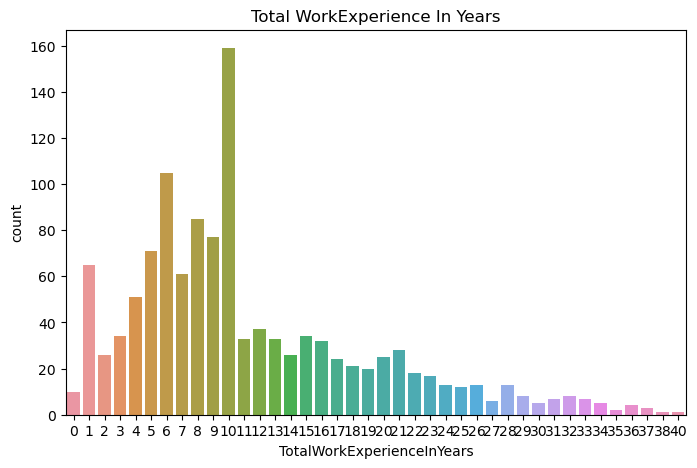

In [35]:
a.loc[a['TotalWorkExperienceInYears'] < a['TotalWorkExperienceInYears'].quantile(0.99)]
plt.figure(figsize=(8,5))
sns.countplot(x=a['TotalWorkExperienceInYears'])
plt.title('Total WorkExperience In Years' )
plt.show()

# Insights :

### We can see that the no. of employees having experience of 10 years is the highest.

In [36]:
c=a.loc[(data['Gender'] == 'Male') & (a['EmpHourlyRate'] >= 30) & (a['EmpJobSatisfaction'] >= 4)]

In [37]:
print(' The male employee whose hourly rate is more than 30 and job satisfaction level is greater then 4 :', len(c))

 The male employee whose hourly rate is more than 30 and job satisfaction level is greater then 4 : 236


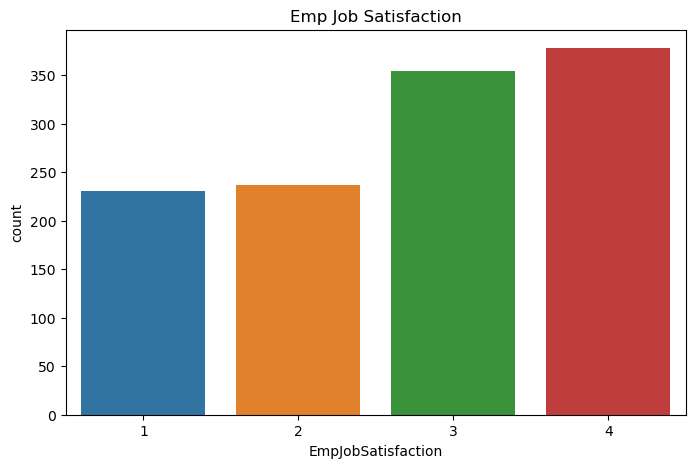

In [38]:
a.loc[a['EmpJobSatisfaction'] < a['EmpJobSatisfaction'].quantile(0.99)]
plt.figure(figsize=(8,5))
sns.countplot(x=a['EmpJobSatisfaction'])
plt.title('Emp Job Satisfaction' )
plt.show()

# Insights :


### Clearly we can see that the Employee Job Satisfaction count is the highest.

In [39]:
d=a.loc[(a['ExperienceYearsAtThisCompany'] >= 10) & (a['ExperienceYearsInCurrentRole'] >= 5) & (a['EmpJobSatisfaction'] >= 4)]

In [40]:
print(' The employee whose experience at this company is more 10 years and experience in current role is more than 5 years and satisfaction level is more than 4 :' , len(d))

 The employee whose experience at this company is more 10 years and experience in current role is more than 5 years and satisfaction level is more than 4 : 93


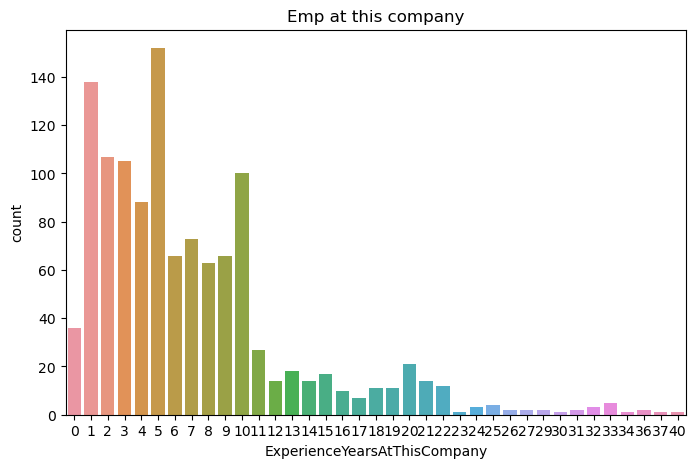

In [41]:
a.loc[a['ExperienceYearsAtThisCompany'] < a['ExperienceYearsAtThisCompany'].quantile(0.99)]
plt.figure(figsize=(8,5))
sns.countplot(x=a['ExperienceYearsAtThisCompany'])
plt.title('Emp at this company' )
plt.show()

# Insights :


### Clearly we can see that the Employees having experience more than 5 years is highest.

In [42]:
a.columns

Index(['EmpNumber', 'Age', 'Gender', 'EducationBackground', 'MaritalStatus',
       'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency',
       'DistanceFromHome', 'EmpEducationLevel', 'EmpEnvironmentSatisfaction',
       'EmpHourlyRate', 'EmpJobInvolvement', 'EmpJobLevel',
       'EmpJobSatisfaction', 'NumCompaniesWorked', 'OverTime',
       'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction',
       'TotalWorkExperienceInYears', 'TrainingTimesLastYear',
       'EmpWorkLifeBalance', 'ExperienceYearsAtThisCompany',
       'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'Attrition', 'PerformanceRating'],
      dtype='object')

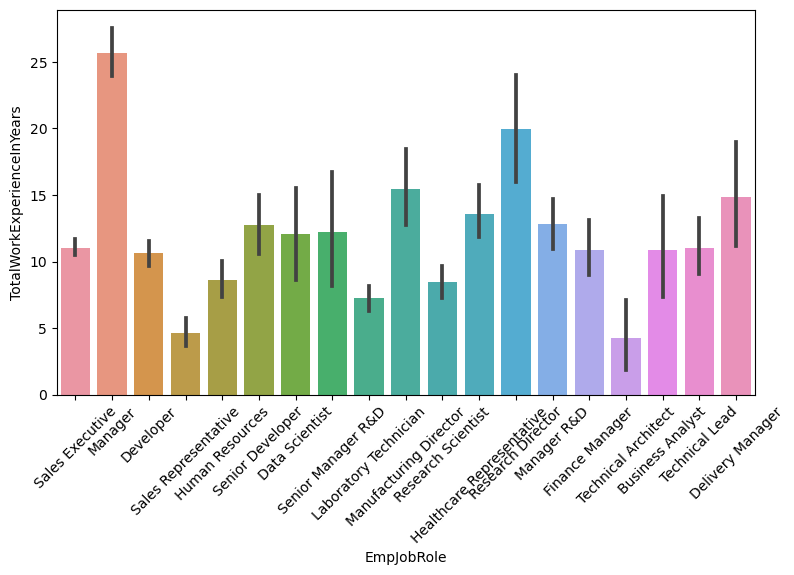

In [43]:
plt.figure(figsize=(9,5))
sns.barplot(x=a['EmpJobRole'], y=a['TotalWorkExperienceInYears'], data=a)
plt.xticks(rotation=45)
plt.show()  

# Insights :

### Clearly we can see that the Job role type : (' Manager & Research Director ' ) are having more no. of employees and they are having Experience of more than 20 years.

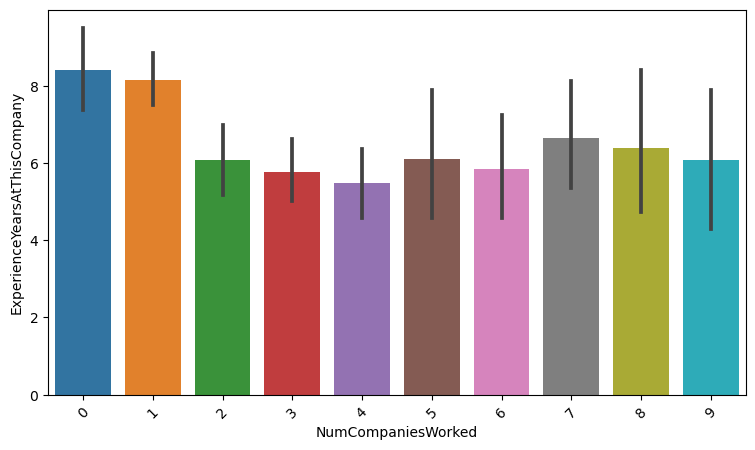

In [44]:
plt.figure(figsize=(9,5))
sns.barplot(x=a['NumCompaniesWorked'], y=a['ExperienceYearsAtThisCompany'], data=a)
plt.xticks(rotation=45)
plt.show() 

# Insights :


### We can say that the Employees who have worked in most of previous companies are having atleast experience of 5 years.

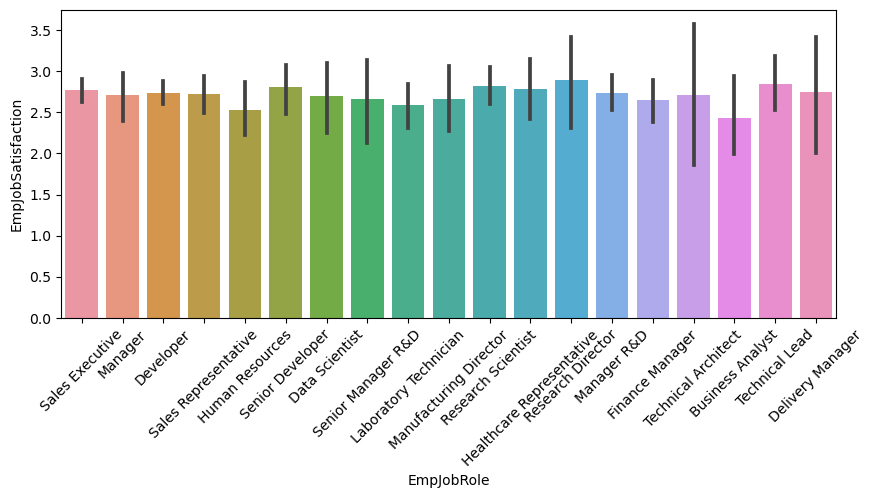

In [45]:
plt.figure(figsize=(10,4))
sns.barplot(x=a['EmpJobRole'], y=a['EmpJobSatisfaction'], data=a)
plt.xticks(rotation=45)
plt.show()  # 

# Insights :

### We can be able to figure out that the employees of each department having some how same level of satisfaction.

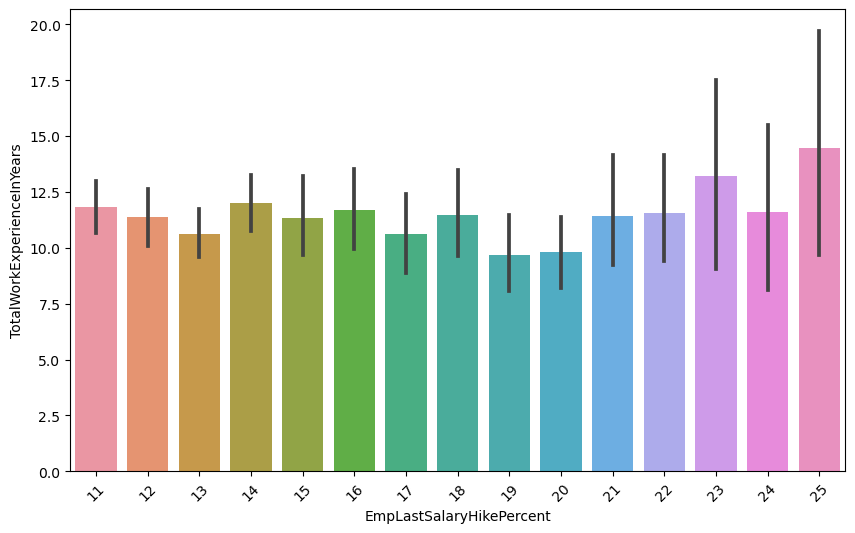

In [46]:
plt.figure(figsize=(10,6))
sns.barplot(x=a['EmpLastSalaryHikePercent'], y=a['TotalWorkExperienceInYears'], data=a)
plt.xticks(rotation=45)
plt.show() 

# Insights :


### We can be able to see that the if the Employees are having experience of atleast 10 years will be getting a hike of in between 15-20 %.

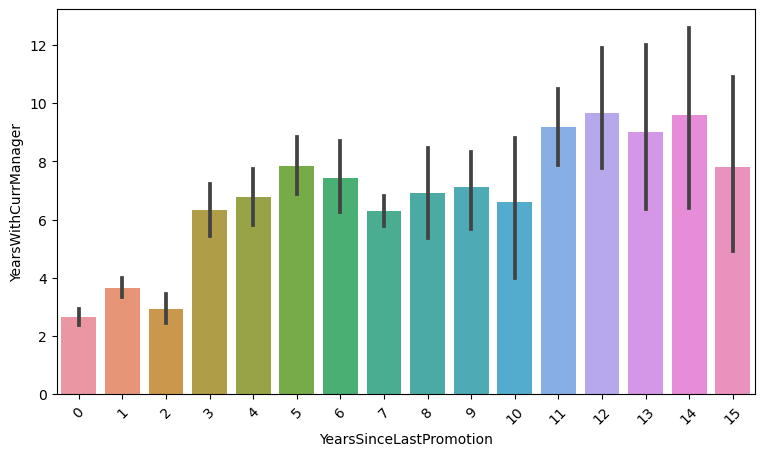

In [47]:
plt.figure(figsize=(9,5))
sns.barplot(x=a['YearsSinceLastPromotion'], y=a['YearsWithCurrManager'], data=a)
plt.xticks(rotation=45)
plt.show() 

# Insights :


### We can be able to see that the Employees who worked atleast 6 years with the Current Manager will be promoted.

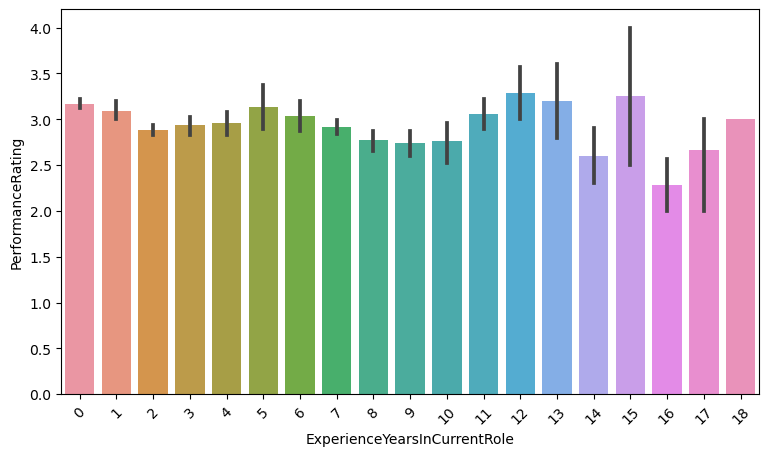

In [48]:
plt.figure(figsize=(9,5))
sns.barplot(x=a['ExperienceYearsInCurrentRole'], y=a['PerformanceRating'], data=a)
plt.xticks(rotation=45)
plt.show() 

# Insights :


### The employees having  experience of more than 4 years will be having performance rating of in between 2.5 and 3.3.

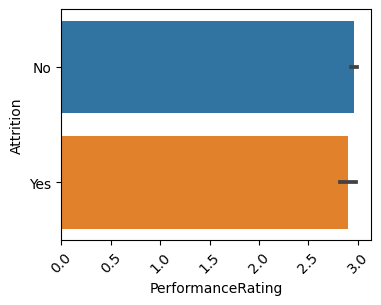

In [49]:
plt.figure(figsize=(4,3))
sns.barplot(x=a['PerformanceRating'], y=a['Attrition'], data=a)
plt.xticks(rotation=45)
plt.show() 

# Insights : 

### We can say that the Employees having performance rating of least no. 2 having more chances of leaving the Company.

# Univariate Analysis :

# Analysis for Numerical Columns :

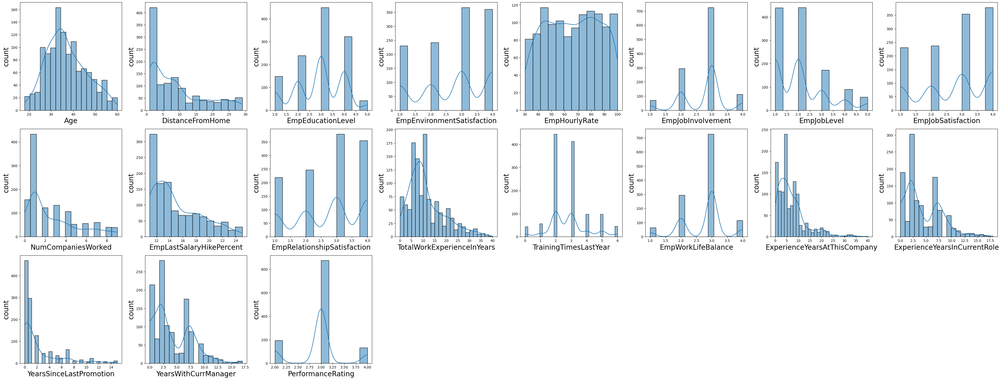

In [50]:
plt.figure(figsize=(40,40),facecolor='white')
plotnumber=1

for column in Numerical_columns:
    if plotnumber<=100:
        ax=plt.subplot(8,8,plotnumber)
        sns.histplot(Numerical_columns[column],kde=True)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('count',fontsize=20)
        plotnumber+=1
        plt.tight_layout()

# Bivariate Analysis :

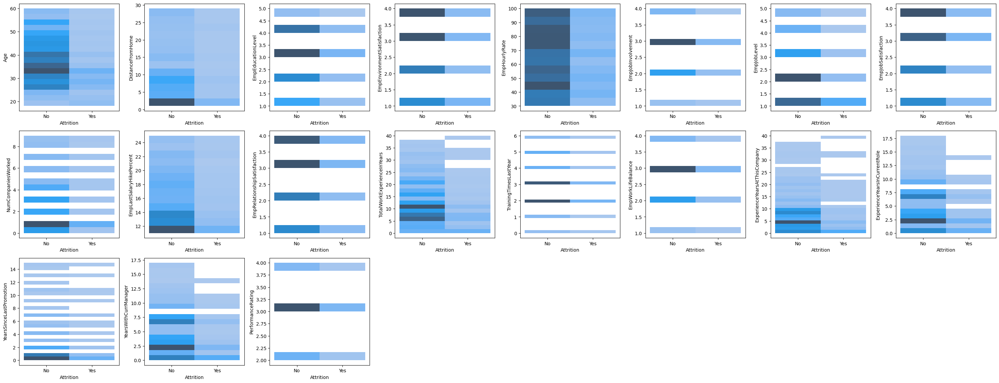

In [51]:
plt.figure(figsize=(30,30),facecolor='white')
plotnumber=1
for column in Numerical_columns:
    if plotnumber < 100:
        ax=plt.subplot(8,8,plotnumber)
        sns.histplot(data=a,x=a['Attrition'],y=a[column],stat='percent',kde=True)
        plt.xlabel('Attrition',fontsize=10)
        plt.ylabel(column,fontsize=10)
    plotnumber+=1
plt.tight_layout()

# Boxplot for detecting the Outliers :

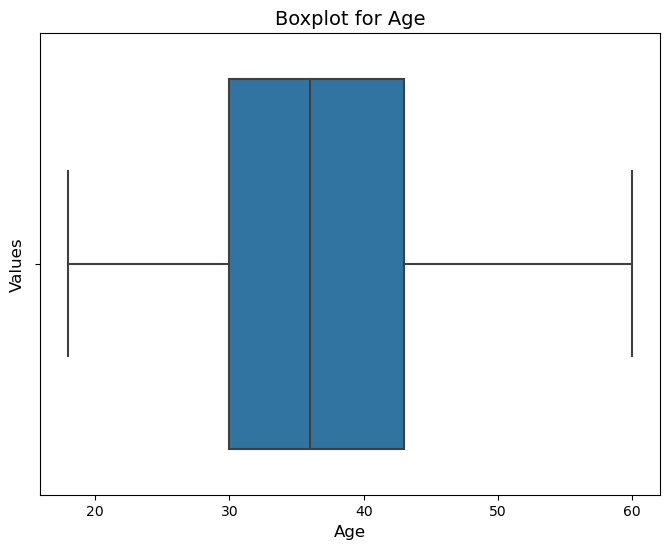

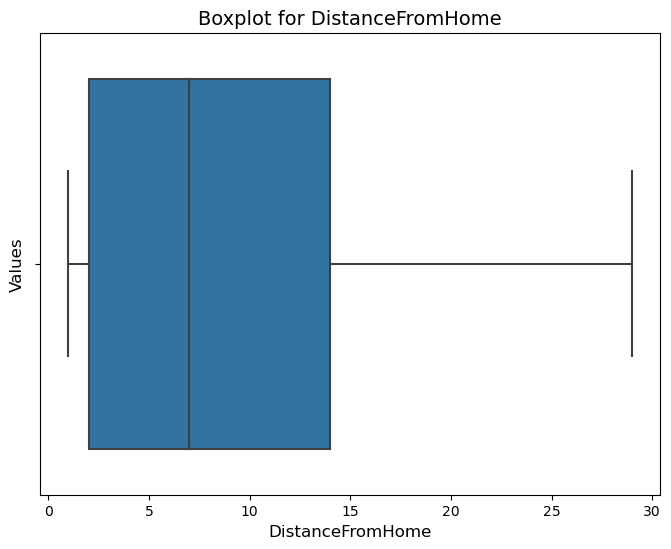

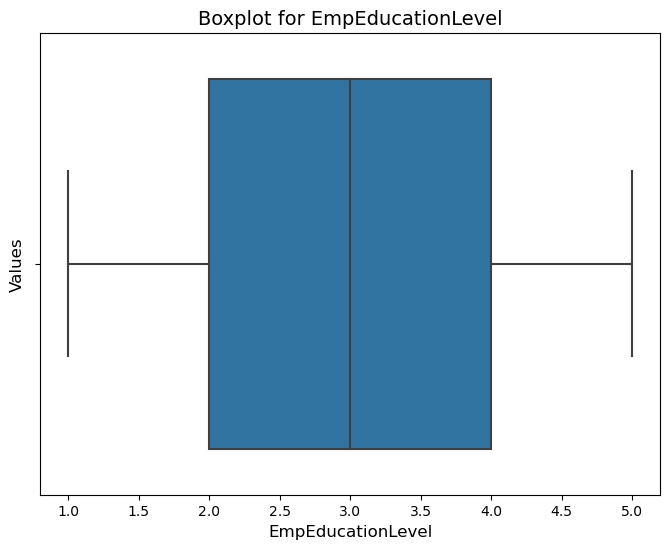

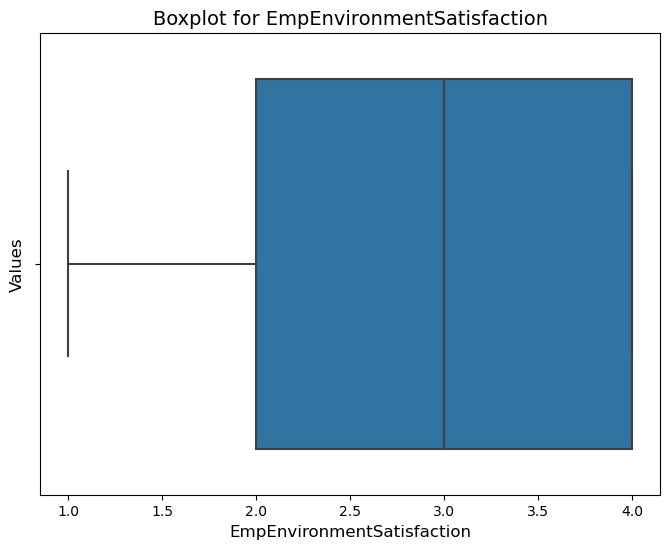

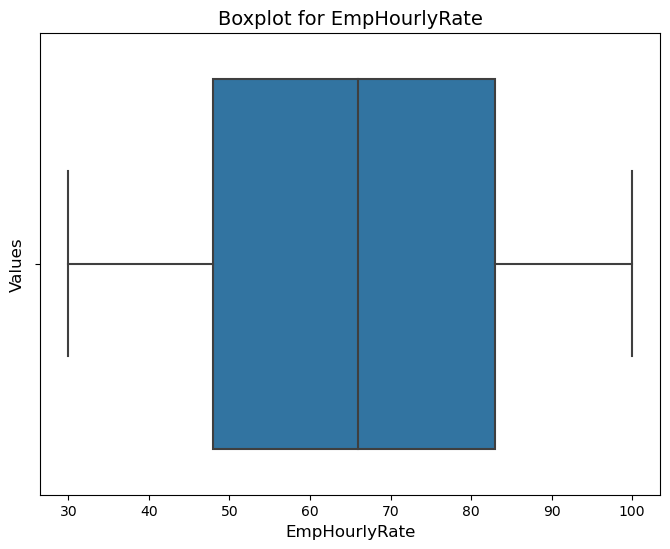

...

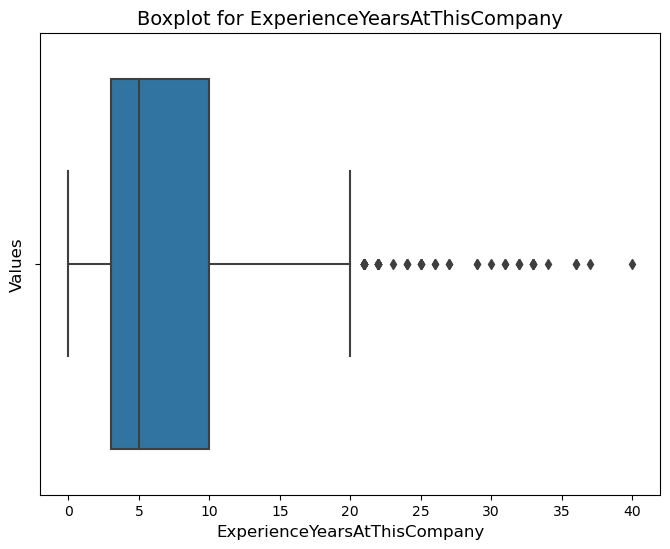

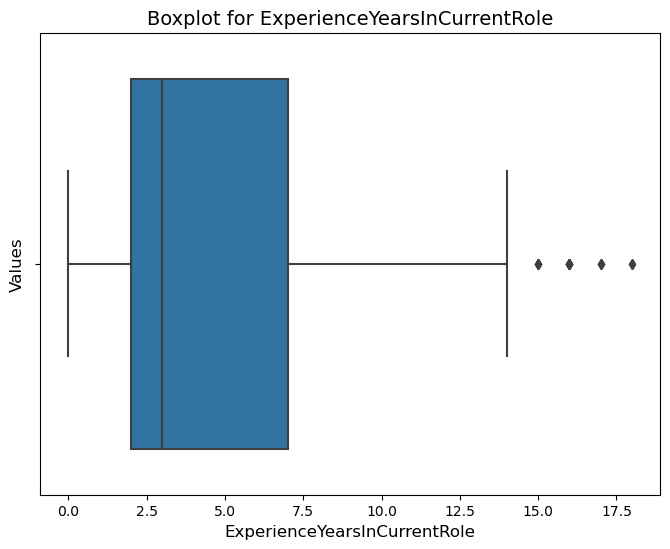

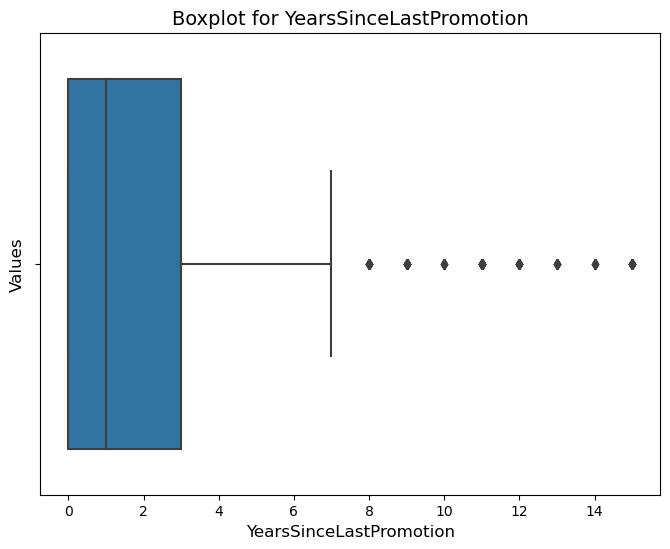

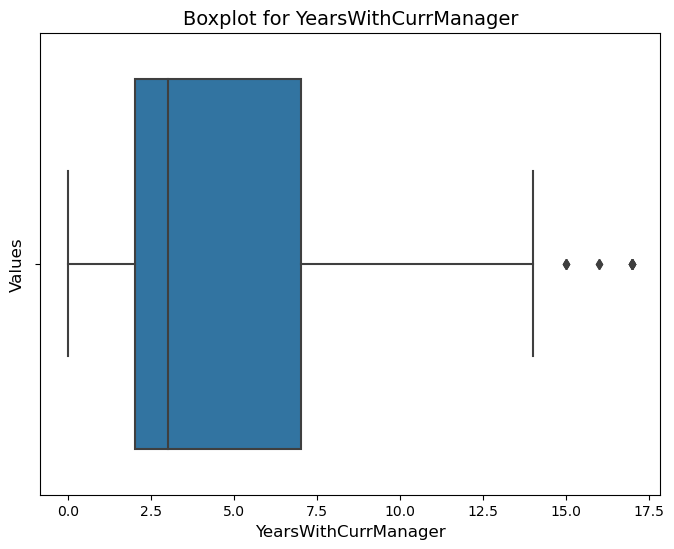

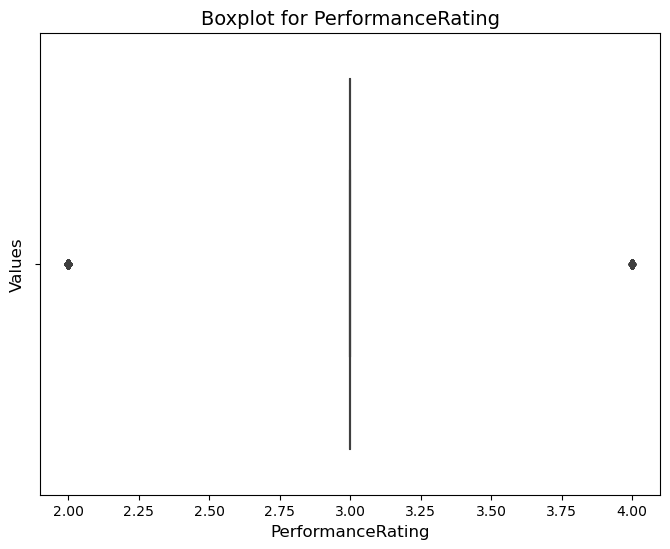

In [52]:
for column in Numerical_columns.columns:
    plt.figure(figsize=(8, 6)) 
    sns.boxplot(x=Numerical_columns[column])
    plt.title(f'Boxplot for {column}', fontsize=14)
    plt.xlabel(column, fontsize=12)
    plt.ylabel('Values', fontsize=12)
    plt.show()

# Analysis for Categorical Columns :

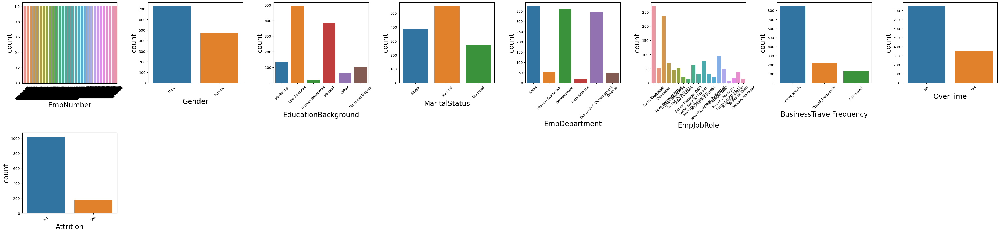

In [53]:
plt.figure(figsize=(40,40),facecolor='white')
plotnumber=1
for column in Categorical_columns:
    if plotnumber<=100:
        ax=plt.subplot(8,8,plotnumber)
        sns.countplot(x=column, data=Categorical_columns)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('count',fontsize=20)
        plotnumber+=1
        plt.xticks(rotation=45)
        plt.tight_layout()

# Visualization to analyze the Data :

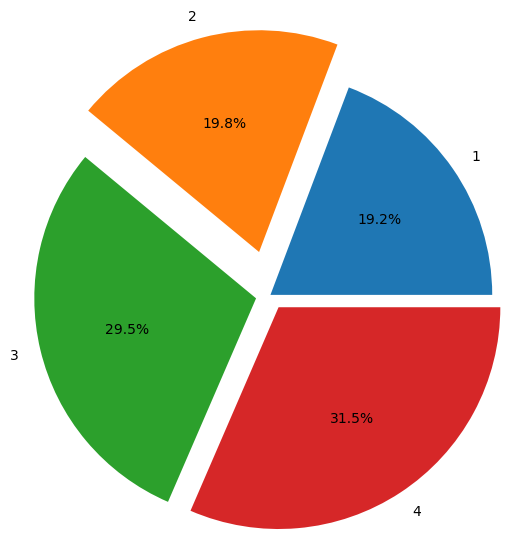

In [54]:
data = a.groupby('EmpJobSatisfaction')['PerformanceRating'].count()
 
explode=[0,0.3,0.1,0.1]
plt.pie(data, labels=data.index, autopct="%0.1f%%",radius=1.5,explode=explode)
plt.show()

In [55]:
data

EmpJobSatisfaction
1    231
2    237
3    354
4    378
Name: Attrition, dtype: int64

# Insights :


### We are here using a pie chart to see the percentage of Empoyee Job Satisfaction with PerformanceRating.

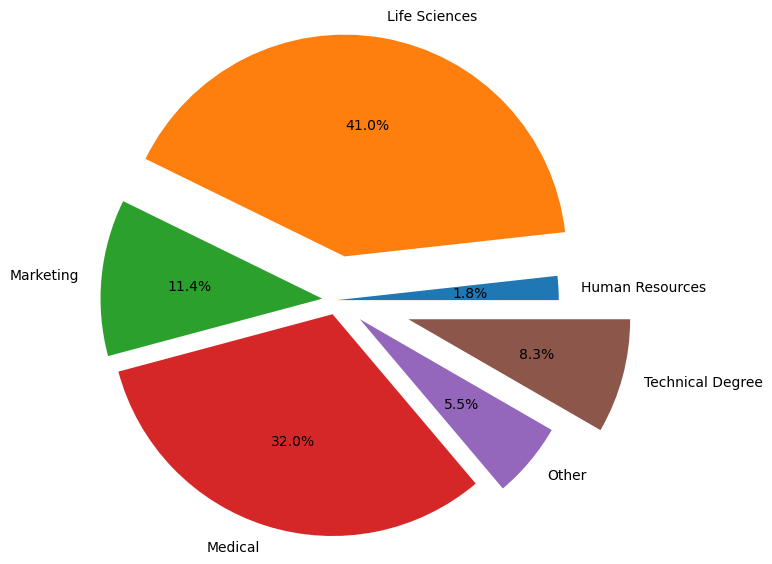

In [56]:
data1 = a.groupby('EducationBackground')['PerformanceRating'].count()
 
explode=[0,0.3,0.1,0.1,0.2,0.5]
plt.pie(data1, labels=data1.index, autopct="%0.1f%%",radius=1.5,explode=explode)
plt.show()

In [57]:
data1

EducationBackground
Human Resources      21
Life Sciences       492
Marketing           137
Medical             384
Other                66
Technical Degree    100
Name: PerformanceRating, dtype: int64

# Insights :


### We are here using a pie chart to see the percentage of Empoyee Education Background with PerformanceRating.

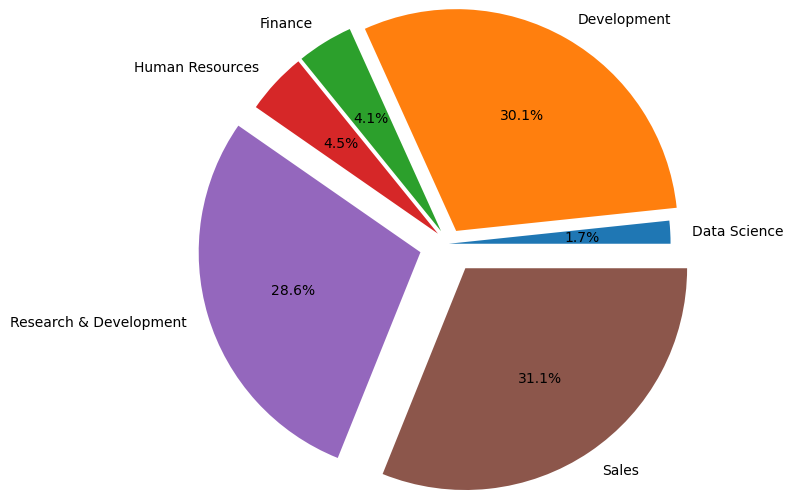

In [59]:
data2 = a.groupby('EmpDepartment')['PerformanceRating'].count()
 
explode=[0,0.1,0.1,0.1,0.2,0.2]
plt.pie(data2, labels=data2.index, autopct="%0.1f%%",radius=1.5,explode=explode)
plt.show()

In [60]:
data2

EmpDepartment
Data Science               20
Development               361
Finance                    49
Human Resources            54
Research & Development    343
Sales                     373
Name: PerformanceRating, dtype: int64

# Insights :


### We are here using a pie chart to see the percentage of Empoyee Department with PerformanceRating.

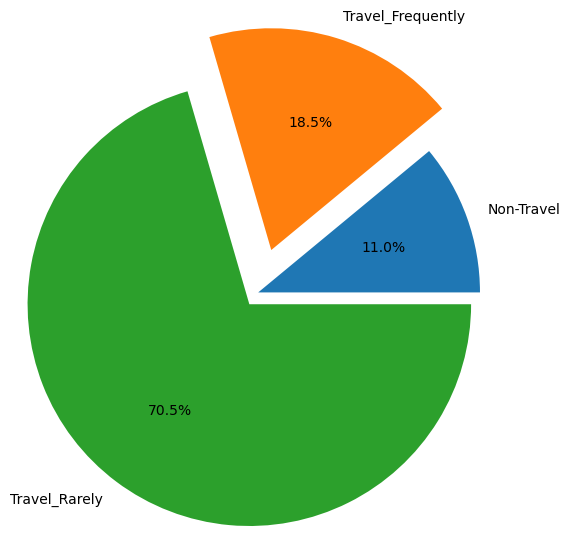

In [61]:
data3 = a.groupby('BusinessTravelFrequency')['PerformanceRating'].count()
 
explode=[0,0.3,0.1]
plt.pie(data3, labels=data3.index, autopct="%0.1f%%",radius=1.5,explode=explode)
plt.show()

In [62]:
data3

BusinessTravelFrequency
Non-Travel           132
Travel_Frequently    222
Travel_Rarely        846
Name: PerformanceRating, dtype: int64

# Insights :


### We are here using a pie chart to see the percentage of Empoyee Travel Frequency with PerformanceRating.

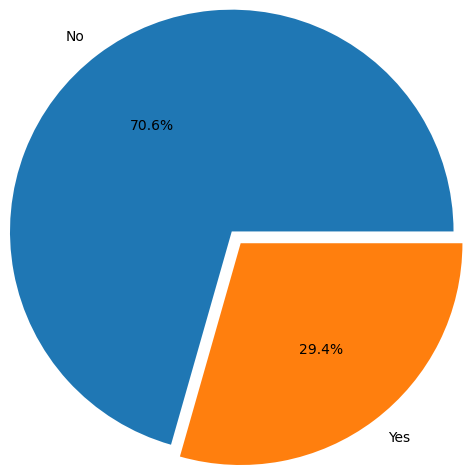

In [63]:
data4 = a.groupby('OverTime')['PerformanceRating'].count()
 
explode=[0,0.1]
plt.pie(data4, labels=data4.index, autopct="%0.1f%%",radius=1.5,explode=explode)
plt.show()

In [64]:
data4

OverTime
No     847
Yes    353
Name: PerformanceRating, dtype: int64

# Insights :


### We are here using a pie chart to see the percentage of Empoyee Over Time with PerformanceRating.

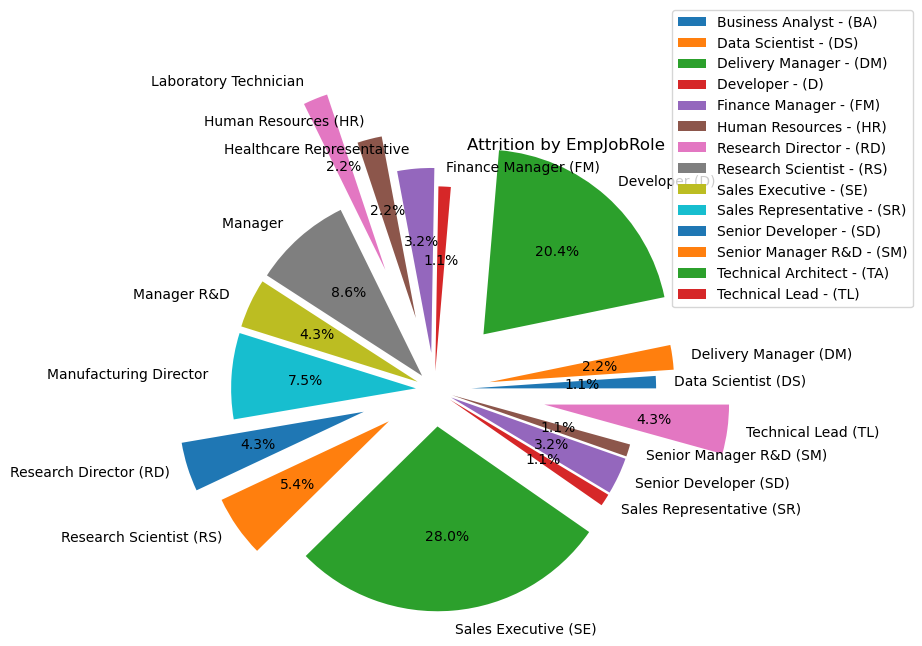

In [65]:
data5 = d.groupby('EmpJobRole')['PerformanceRating'].count()
EmpJobRole_meanings = {
    'Business Analyst': '(BA)',
    'Data Scientist': '(DS)',
    'Delivery Manager': '(DM)',
    'Developer': '(D)',
    'Finance Manager': '(FM)',
    'Human Resources': '(HR)',
    'Research Director': '(RD)',
    'Research Scientist': '(RS)',
    'Sales Executive': '(SE)',
    'Sales Representative': '(SR)',
    'Senior Developer': '(SD)',
    'Senior Manager R&D': '(SM)',
    'Technical Architect': '(TA)',
    'Technical Lead': '(TL)',

    
}
explode=(0.2,0.3,0.4,0.1,0.2,0.4,0.7,0.1,0.1,0.1,0.4,0.3,0.2,0.1,0.1,0.1,0.6)
labels = [f"{EmpJobRole} {EmpJobRole_meanings.get(EmpJobRole,'')}" for EmpJobRole in data5.index]
plt.figure(figsize=(6, 6), facecolor='white')
plt.pie(data5, labels=labels, autopct="%0.1f%%",explode=explode)
plt.title('Attrition by EmpJobRole',loc='right')
legend_labels = [f"{key} - {value}" for key, value in EmpJobRole_meanings.items()]
plt.legend(legend_labels, loc=6, bbox_to_anchor=(1.0, 1.0))
plt.show()
    

In [66]:
data5

EmpJobRole
Data Scientist                1
Delivery Manager              2
Developer                    19
Finance Manager               1
Healthcare Representative     3
Human Resources               2
Laboratory Technician         2
Manager                       8
Manager R&D                   4
Manufacturing Director        7
Research Director             4
Research Scientist            5
Sales Executive              26
Sales Representative          1
Senior Developer              3
Senior Manager R&D            1
Technical Lead                4
Name: PerformanceRating, dtype: int64

# Insights :


### We are here using a pie chart to see the percentage of Empoyee Job Role with PerformanceRating.

In [67]:
a.corr()

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,PerformanceRating
Age,1.000000,0.020937,0.207313,0.013814,0.062867,0.027216,0.509139,-0.002436,0.284408,-0.006105,0.049749,0.680886,-0.016053,-0.019563,0.318852,0.217163,0.228199,0.205098,-0.040164
DistanceFromHome,0.020937,1.000000,0.045856,-0.017719,0.013730,0.003231,0.017270,-0.003036,-0.021411,0.044974,-0.009509,0.027306,-0.032082,-0.044788,0.021908,0.019898,0.013246,0.017860,-0.046142
EmpEducationLevel,0.207313,0.045856,1.000000,-0.037103,0.014095,0.027544,0.100734,0.000357,0.128674,0.002358,-0.016690,0.151062,-0.013674,0.010276,0.076332,0.066672,0.054313,0.088988,0.020529
EmpEnvironmentSatisfaction,0.013814,-0.017719,-0.037103,1.000000,-0.049501,0.004865,-0.008272,-0.004319,0.017270,-0.047271,-0.010504,-0.012894,0.001192,-0.000262,-0.000561,0.025491,0.010732,-0.011702,0.395561
EmpHourlyRate,0.062867,0.013730,0.014095,-0.049501,1.000000,0.054741,-0.018606,-0.066417,0.040484,-0.015934,0.008783,0.026034,-0.024160,0.016189,-0.000399,-0.011871,-0.010000,-0.004576,-0.043116
EmpJobInvolvement,0.027216,0.003231,0.027544,0.004865,0.054741,1.000000,-0.034349,-0.005501,0.018211,-0.001742,0.018037,-0.028851,-0.025168,-0.014129,-0.039720,0.002910,-0.019944,0.012924,-0.010539
EmpJobLevel,0.509139,0.017270,0.100734,-0.008272,-0.018606,-0.034349,1.000000,-0.011853,0.127477,-0.020975,0.002992,0.784229,-0.000389,0.049218,0.540377,0.399235,0.360880,0.374872,-0.076632
EmpJobSatisfaction,-0.002436,-0.003036,0.000357,-0.004319,-0.066417,-0.005501,-0.011853,1.000000,-0.049865,0.031847,-0.022028,-0.026824,-0.028031,-0.018548,0.001807,0.002018,-0.006508,-0.022096,0.000606
NumCompaniesWorked,0.284408,-0.021411,0.128674,0.017270,0.040484,0.018211,0.127477,-0.049865,1.000000,-0.011788,0.057917,0.221505,-0.050817,0.002489,-0.129797,-0.097271,-0.031656,-0.109937,0.020980
EmpLastSalaryHikePercent,-0.006105,0.044974,0.002358,-0.047271,-0.015934,-0.001742,-0.020975,0.031847,-0.011788,1.000000,-0.042892,-0.005933,-0.013439,-0.017001,-0.019830,-0.004957,-0.015911,-0.007666,0.333722


In [68]:
correaltion_matrix=a.corr()
print(correaltion_matrix)

                                   Age  DistanceFromHome  EmpEducationLevel  \
Age                           1.000000          0.020937           0.207313   
DistanceFromHome              0.020937          1.000000           0.045856   
EmpEducationLevel             0.207313          0.045856           1.000000   
EmpEnvironmentSatisfaction    0.013814         -0.017719          -0.037103   
EmpHourlyRate                 0.062867          0.013730           0.014095   
EmpJobInvolvement             0.027216          0.003231           0.027544   
EmpJobLevel                   0.509139          0.017270           0.100734   
EmpJobSatisfaction           -0.002436         -0.003036           0.000357   
NumCompaniesWorked            0.284408         -0.021411           0.128674   
EmpLastSalaryHikePercent     -0.006105          0.044974           0.002358   
EmpRelationshipSatisfaction   0.049749         -0.009509          -0.016690   
TotalWorkExperienceInYears    0.680886          0.02

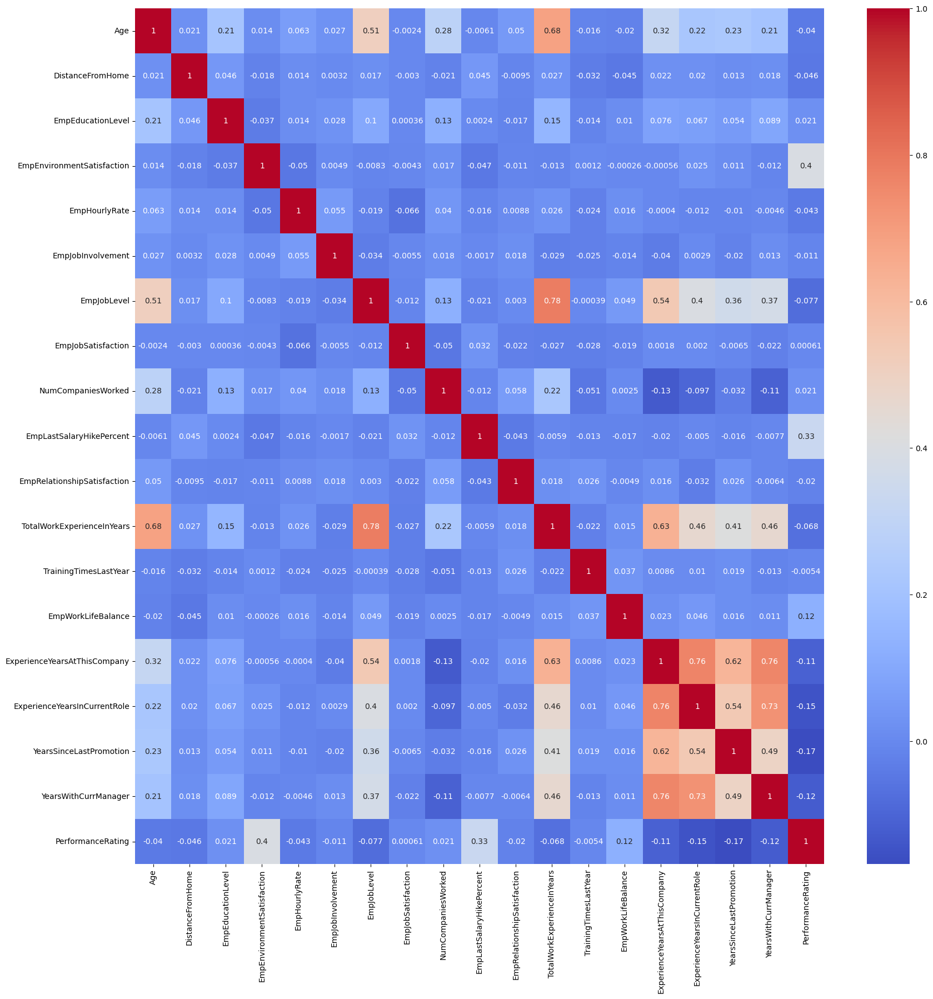

In [69]:
# Increase the figure size
plt.figure(figsize=(20, 20))

# Create the heatmap
sns.heatmap(correaltion_matrix, annot=True, cmap='coolwarm')

# Show the plot
plt.show()

# Insights :


### Many of features have relatively lower positive correlations with the target. Whether to keep or drop them depends on your specific modeling objectives and the importance of these features in our domain Knowledge.


In [70]:
from sklearn.preprocessing import LabelEncoder

# Assuming 'matchType' is a categorical column in your DataFrame
encoder = LabelEncoder()

# Fit and transform the 'matchType' column to obtain label-encoded values
a['Attrition'] = encoder.fit_transform(a['Attrition'])

# Display the result
print(a[['Attrition', 'Attrition']])

      Attrition  Attrition
0             0          0
1             0          0
2             0          0
3             0          0
4             0          0
...         ...        ...
1195          0          0
1196          0          0
1197          0          0
1198          0          0
1199          1          1

[1200 rows x 2 columns]


In [71]:
a.Attrition.value_counts()

0    1022
1     178
Name: Attrition, dtype: int64

In [72]:
correaltion_matrix = a.corr()
correlations_with_target = correaltion_matrix['Attrition'].sort_values(ascending=False)
print(correlations_with_target)

Attrition                       1.000000
DistanceFromHome                0.063248
NumCompaniesWorked              0.037643
EmpLastSalaryHikePercent       -0.009448
EmpHourlyRate                  -0.026313
TrainingTimesLastYear          -0.035047
EmpRelationshipSatisfaction    -0.037179
PerformanceRating              -0.039796
EmpEducationLevel              -0.049118
YearsSinceLastPromotion        -0.057199
EmpWorkLifeBalance             -0.068624
EmpJobSatisfaction             -0.081783
EmpEnvironmentSatisfaction     -0.123490
ExperienceYearsAtThisCompany   -0.142456
EmpJobInvolvement              -0.153360
YearsWithCurrManager           -0.158745
ExperienceYearsInCurrentRole   -0.173895
EmpJobLevel                    -0.175763
TotalWorkExperienceInYears     -0.185226
Age                            -0.189317
Name: Attrition, dtype: float64


# Checking that any features are corelated or not ?

In [73]:
def correlation(a,threshold):
    col_corr=set()  # creating empty set
    corr_matrix = a.corr().abs()
    for i in range (len(corr_matrix.columns)): #abs for absolute error
        for j in range(i):
            if corr_matrix.iloc[i,j] > threshold:
                colname=corr_matrix.columns[i] # getting the name of column
                col_corr.add(colname)
    return col_corr

In [74]:
corr_feature=correlation(a,0.85)
len(set(corr_feature))

0

In [75]:
# perform after filling null values and before categorical to numerical conversion
# if p value is less than 0.05 then there is some corelation and we reject the null hypothesis, if greater than visa versa
from scipy.stats import chi2_contingency

def cat_corr(d):
    columns = a.select_dtypes(include='object').columns.tolist()
    results = []

    for x in columns:
        for y in columns:
            if x != y:  # Avoid comparing a column with itself
                ct = pd.crosstab(index=d[x], columns=d[y])
                chi_sq_result = chi2_contingency(ct)
                p_value = chi_sq_result[1]
                correlation = "correlated" if p_value < 0.05 else "not correlated"
                
                results.append({
                    "Column_X": x,
                    "Column_Y": y,
                    "p-value": p_value,
                    "correlation": correlation,
                    "degrees_of_freedom": chi_sq_result[2]
                })
    
    return pd.DataFrame(results)

# Usage:
# Assuming 'g' is your DataFrame containing categorical columns
correlation_results_df = cat_corr(a)

# Filter the DataFrame to get correlated and not correlated columns
correlated_columns = correlation_results_df[correlation_results_df['correlation'] == 'correlated']
not_correlated_columns = correlation_results_df[correlation_results_df['correlation'] == 'not correlated']

print("Correlated Columns:")
print(correlated_columns)
c=pd.DataFrame(correlated_columns)
print("\nNot Correlated Columns:")
print(not_correlated_columns)

Correlated Columns:
                   Column_X                 Column_Y        p-value  \
11                   Gender               EmpJobRole   2.846231e-02   
17      EducationBackground            EmpDepartment  8.608345e-154   
18      EducationBackground               EmpJobRole  3.207404e-105   
26            MaritalStatus  BusinessTravelFrequency   4.425581e-02   
30            EmpDepartment      EducationBackground  8.608345e-154   
32            EmpDepartment               EmpJobRole   0.000000e+00   
36               EmpJobRole                   Gender   2.846231e-02   
37               EmpJobRole      EducationBackground  3.207404e-105   
39               EmpJobRole            EmpDepartment   0.000000e+00   
45  BusinessTravelFrequency            MaritalStatus   4.425581e-02   

   correlation  degrees_of_freedom  
11  correlated                  18  
17  correlated                  25  
18  correlated                  90  
26  correlated                   4  
30  correlate

In [76]:
Not_correalted=pd.DataFrame(not_correlated_columns)
Not_correalted

,Column_X,Column_Y,p-value,correlation,degrees_of_freedom
0,EmpNumber,Gender,0.486427,not correlated,1199
1,EmpNumber,EducationBackground,0.479369,not correlated,5995
2,EmpNumber,MaritalStatus,0.484645,not correlated,2398
3,EmpNumber,EmpDepartment,0.479369,not correlated,5995
4,EmpNumber,EmpJobRole,0.464214,not correlated,21582
5,EmpNumber,BusinessTravelFrequency,0.484645,not correlated,2398
6,EmpNumber,OverTime,0.486427,not correlated,1199
7,Gender,EmpNumber,0.486427,not correlated,1199
8,Gender,EducationBackground,0.679540,not correlated,5
9,Gender,MaritalStatus,0.343620,not correlated,2


In [77]:
Correlated =pd.DataFrame(correlated_columns)

In [78]:
Correlated

,Column_X,Column_Y,p-value,correlation,degrees_of_freedom
11,Gender,EmpJobRole,2.846231e-02,correlated,18
17,EducationBackground,EmpDepartment,8.608345e-154,correlated,25
18,EducationBackground,EmpJobRole,3.207404e-105,correlated,90
26,MaritalStatus,BusinessTravelFrequency,4.425581e-02,correlated,4
30,EmpDepartment,EducationBackground,8.608345e-154,correlated,25
32,EmpDepartment,EmpJobRole,0.000000e+00,correlated,90
36,EmpJobRole,Gender,2.846231e-02,correlated,18
37,EmpJobRole,EducationBackground,3.207404e-105,correlated,90
39,EmpJobRole,EmpDepartment,0.000000e+00,correlated,90
45,BusinessTravelFrequency,MaritalStatus,4.425581e-02,correlated,4


In [79]:
from scipy.stats import chi2_contingency

def remove_correlated_columns(Categorical_columns):
    columns = Categorical_columns.select_dtypes(include='object').columns.tolist()
    correlated_columns = set()

    for x in columns:
        for y in columns:
            if x != y:
                ct = pd.crosstab(index=Categorical_columns[x], columns=Categorical_columns[y])
                chi_sq_result = chi2_contingency(ct)
                p_value = chi_sq_result[1]
            
                if p_value < 0.01:  
                    correlated_columns.add(x)
                    correlated_columns.add(y)
    
    Categorical_columns.drop(columns=list(correlated_columns), inplace=True)
    return Categorical_columns

d_without_correlated = remove_correlated_columns(Categorical_columns)


In [80]:
d_without_correlated

,EmpNumber,Gender
0,E1001000,Male
1,E1001006,Male
2,E1001007,Male
3,E1001009,Male
4,E1001010,Male
...,...,...
1195,E100992,Female
1196,E100993,Male
1197,E100994,Male
1198,E100995,Female


# Insights:


### Chi-Square Test: The Chi-Square test (χ² test) is used for feature selection when you have categorical features and a categorical target variable (classification tasks).
### It measures the dependency between a categorical feature and the categorical target variable. Features with high chi-squared scores have a significant relationship with the target variable and are considered important.
### It's a common method for feature selection in classification tasks with categorical data.

# Feature Engineering

# Label Encoding : For categorical Columns'

In [81]:
from sklearn.preprocessing import LabelEncoder
categorical_columns = ['EmpNumber', 'Gender', 'EducationBackground', 'MaritalStatus',
       'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency', 'OverTime',
       'Attrition']

encoder = LabelEncoder()
for column in categorical_columns:
    a[f'{column}_encoded'] = encoder.fit_transform(a[column])

In [82]:
a=a.drop(['EmpNumber', 'Gender', 'EducationBackground', 'MaritalStatus', 
       'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency', 'OverTime',
       'Attrition'],axis=1) # not relevant.

In [83]:
a.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 28 columns):
 #   Column                           Non-Null Count  Dtype
---  ------                           --------------  -----
 0   Age                              1200 non-null   int64
 1   DistanceFromHome                 1200 non-null   int64
 2   EmpEducationLevel                1200 non-null   int64
 3   EmpEnvironmentSatisfaction       1200 non-null   int64
 4   EmpHourlyRate                    1200 non-null   int64
 5   EmpJobInvolvement                1200 non-null   int64
 6   EmpJobLevel                      1200 non-null   int64
 7   EmpJobSatisfaction               1200 non-null   int64
 8   NumCompaniesWorked               1200 non-null   int64
 9   EmpLastSalaryHikePercent         1200 non-null   int64
 10  EmpRelationshipSatisfaction      1200 non-null   int64
 11  TotalWorkExperienceInYears       1200 non-null   int64
 12  TrainingTimesLastYear            1200 non-null  

In [84]:
a=a.astype('int64') # Changing the datatype of the features.

In [85]:
a.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 28 columns):
 #   Column                           Non-Null Count  Dtype
---  ------                           --------------  -----
 0   Age                              1200 non-null   int64
 1   DistanceFromHome                 1200 non-null   int64
 2   EmpEducationLevel                1200 non-null   int64
 3   EmpEnvironmentSatisfaction       1200 non-null   int64
 4   EmpHourlyRate                    1200 non-null   int64
 5   EmpJobInvolvement                1200 non-null   int64
 6   EmpJobLevel                      1200 non-null   int64
 7   EmpJobSatisfaction               1200 non-null   int64
 8   NumCompaniesWorked               1200 non-null   int64
 9   EmpLastSalaryHikePercent         1200 non-null   int64
 10  EmpRelationshipSatisfaction      1200 non-null   int64
 11  TotalWorkExperienceInYears       1200 non-null   int64
 12  TrainingTimesLastYear            1200 non-null  

In [86]:
a.columns

Index(['Age', 'DistanceFromHome', 'EmpEducationLevel',
       'EmpEnvironmentSatisfaction', 'EmpHourlyRate', 'EmpJobInvolvement',
       'EmpJobLevel', 'EmpJobSatisfaction', 'NumCompaniesWorked',
       'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction',
       'TotalWorkExperienceInYears', 'TrainingTimesLastYear',
       'EmpWorkLifeBalance', 'ExperienceYearsAtThisCompany',
       'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'PerformanceRating', 'EmpNumber_encoded',
       'Gender_encoded', 'EducationBackground_encoded',
       'MaritalStatus_encoded', 'EmpDepartment_encoded', 'EmpJobRole_encoded',
       'BusinessTravelFrequency_encoded', 'OverTime_encoded',
       'Attrition_encoded'],
      dtype='object')

In [87]:
x=a.drop(['PerformanceRating'],axis=1)
y=a['PerformanceRating']
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=2)

In [88]:
x_train.shape

(840, 27)

In [89]:
x_test.shape

(360, 27)

In [90]:
y_train.shape

(840,)

In [91]:
y_test.shape

(360,)

# Feature Scaling :

In [92]:
x_train=pd.DataFrame(x_train)
x_test=pd.DataFrame(x_test)
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x_train_scaled=scaler.fit_transform(x_train)
x_test_scaled=scaler.transform(x_test)

x_train_scaled=pd.DataFrame(x_train_scaled,columns=x_train.columns,index=x_train.index)
x_test_scaled=pd.DataFrame(x_test_scaled,columns=x_test.columns,index=x_test.index)


In [93]:
print("Number of features in x_train:", x_train.shape[1])
print("Number of features in x_test:", x_test.shape[1])


Number of features in x_train: 27
Number of features in x_test: 27


In [94]:
x_train_scaled.columns

Index(['Age', 'DistanceFromHome', 'EmpEducationLevel',
       'EmpEnvironmentSatisfaction', 'EmpHourlyRate', 'EmpJobInvolvement',
       'EmpJobLevel', 'EmpJobSatisfaction', 'NumCompaniesWorked',
       'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction',
       'TotalWorkExperienceInYears', 'TrainingTimesLastYear',
       'EmpWorkLifeBalance', 'ExperienceYearsAtThisCompany',
       'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'EmpNumber_encoded', 'Gender_encoded',
       'EducationBackground_encoded', 'MaritalStatus_encoded',
       'EmpDepartment_encoded', 'EmpJobRole_encoded',
       'BusinessTravelFrequency_encoded', 'OverTime_encoded',
       'Attrition_encoded'],
      dtype='object')

In [95]:
x_train_scaled.isnull().sum()

Age                                0
DistanceFromHome                   0
EmpEducationLevel                  0
EmpEnvironmentSatisfaction         0
EmpHourlyRate                      0
EmpJobInvolvement                  0
EmpJobLevel                        0
EmpJobSatisfaction                 0
NumCompaniesWorked                 0
EmpLastSalaryHikePercent           0
EmpRelationshipSatisfaction        0
TotalWorkExperienceInYears         0
TrainingTimesLastYear              0
EmpWorkLifeBalance                 0
ExperienceYearsAtThisCompany       0
ExperienceYearsInCurrentRole       0
YearsSinceLastPromotion            0
YearsWithCurrManager               0
EmpNumber_encoded                  0
Gender_encoded                     0
EducationBackground_encoded        0
MaritalStatus_encoded              0
EmpDepartment_encoded              0
EmpJobRole_encoded                 0
BusinessTravelFrequency_encoded    0
OverTime_encoded                   0
Attrition_encoded                  0
d

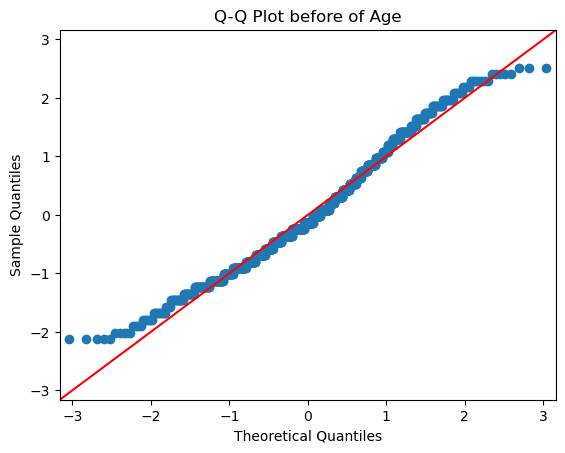

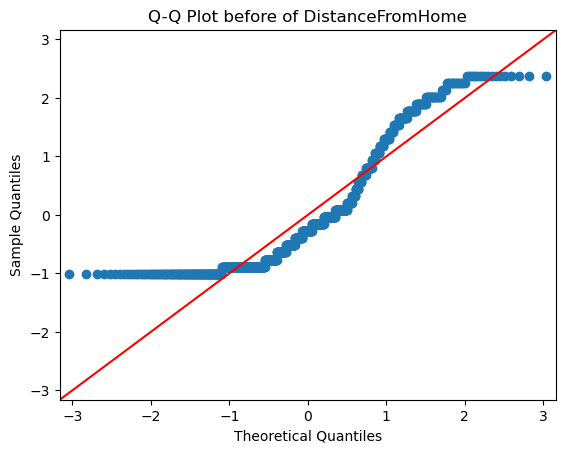

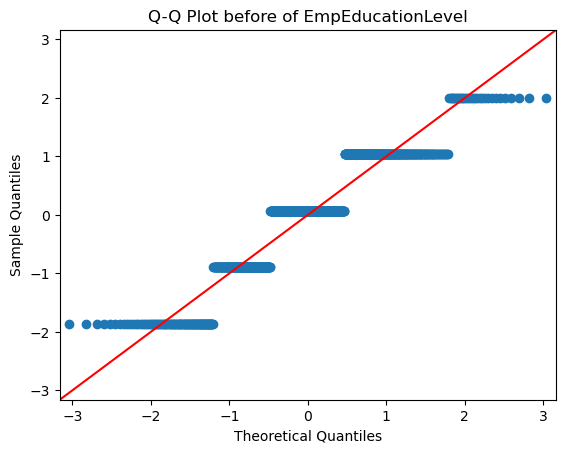

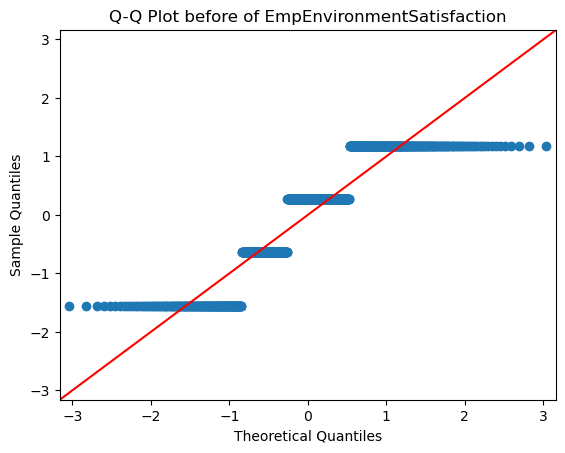

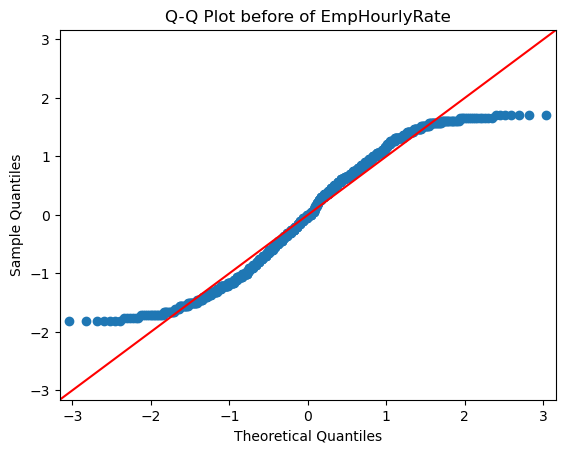

...

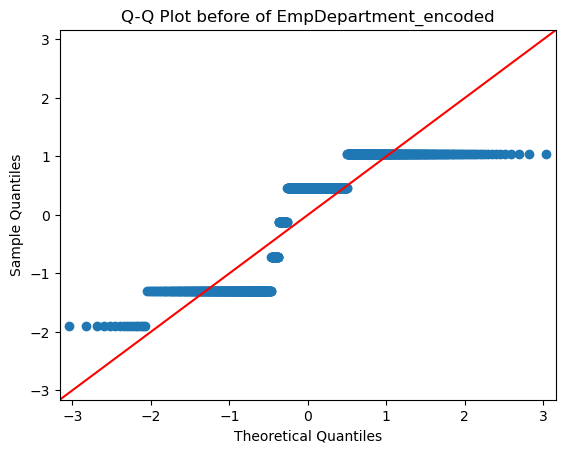

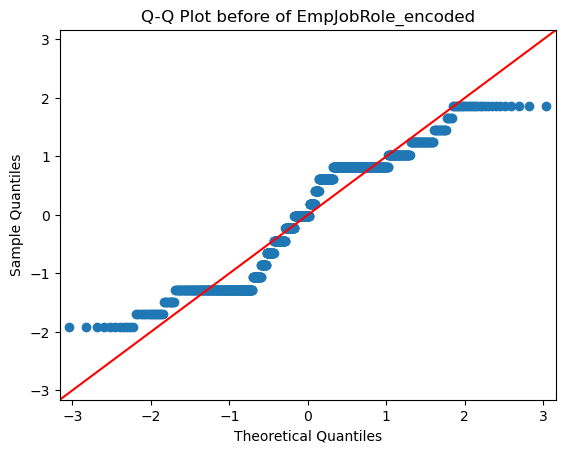

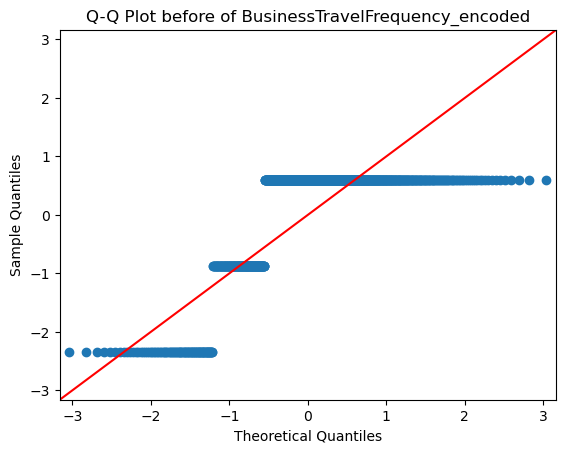

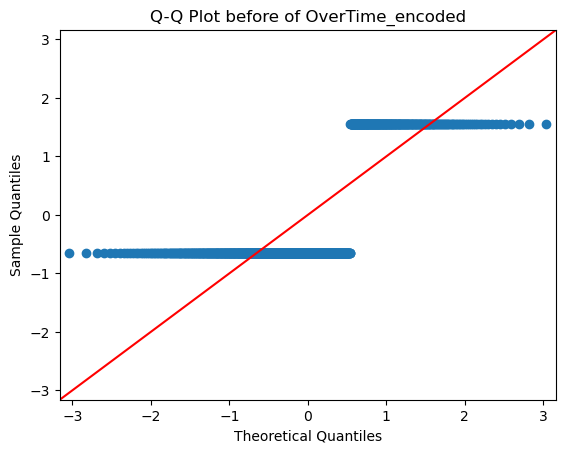

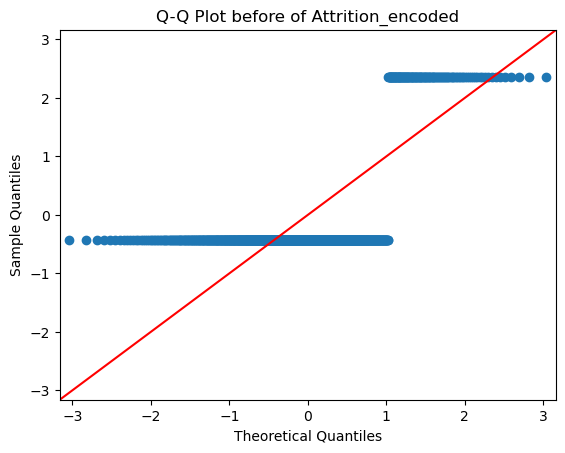

In [96]:
import statsmodels.api as sm
for column in x_train_scaled.columns:
    fig = sm.qqplot( x_train_scaled[column], line='45')  # Create Q-Q plot for the column
    plt.title(f"Q-Q Plot before of {column}")
    plt.show()

# Insights :


### A QQ plot, which stands for Quantile-Quantile plot, is a graphical tool used in statistics to assess whether a dataset follows a particular theoretical distribution. It compares the quantiles of the observed data against the quantiles of a specified probability distribution, usually the normal distribution.

# We are trying to find how the data were Skewed.

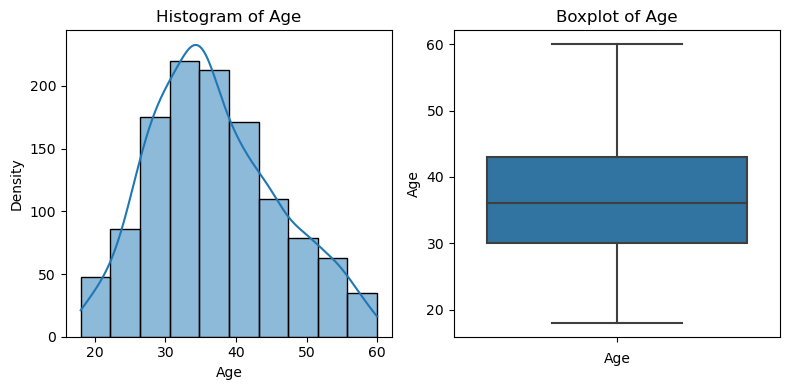

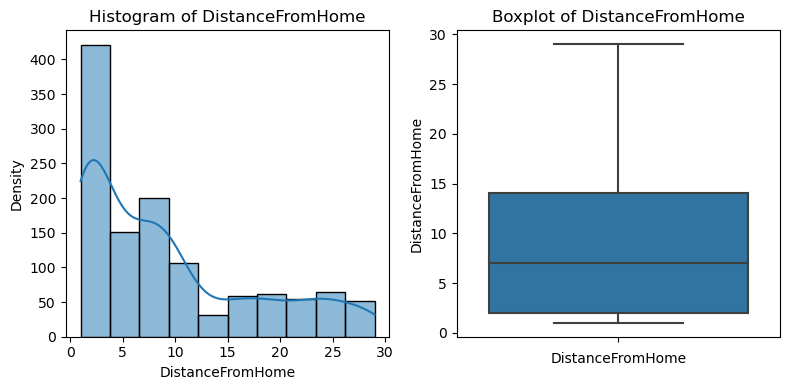

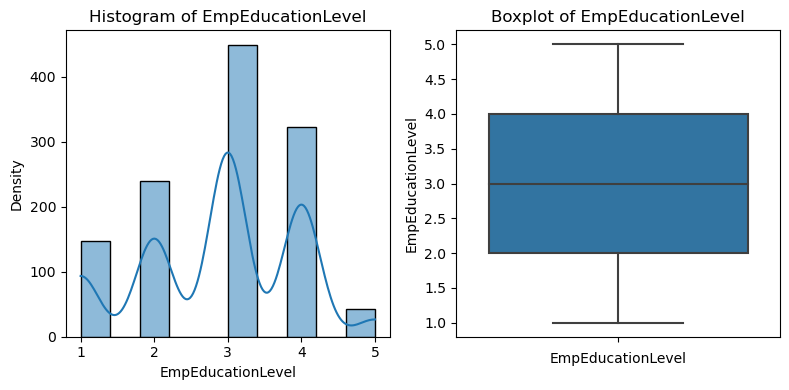

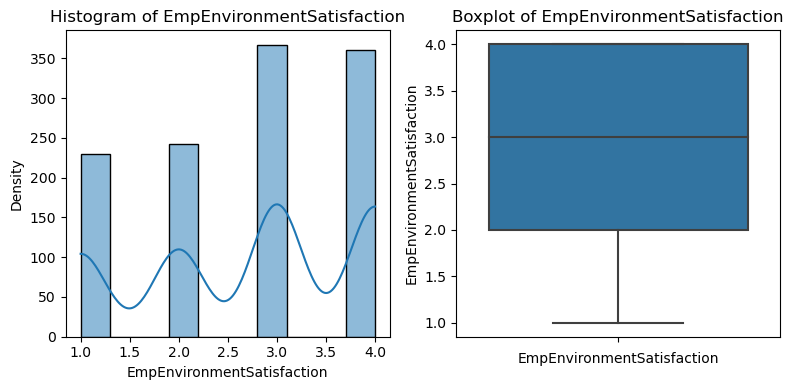

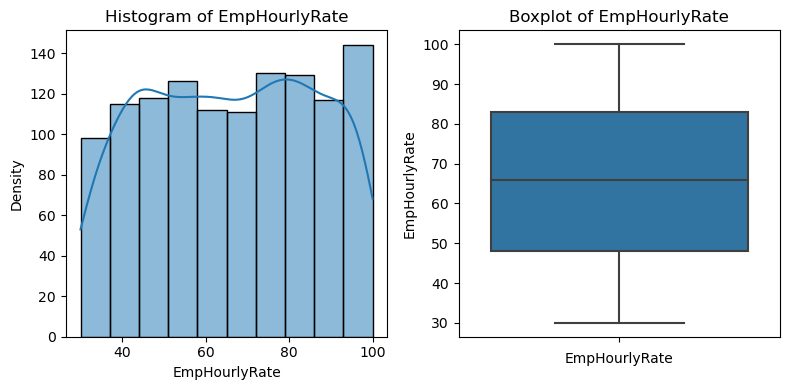

...

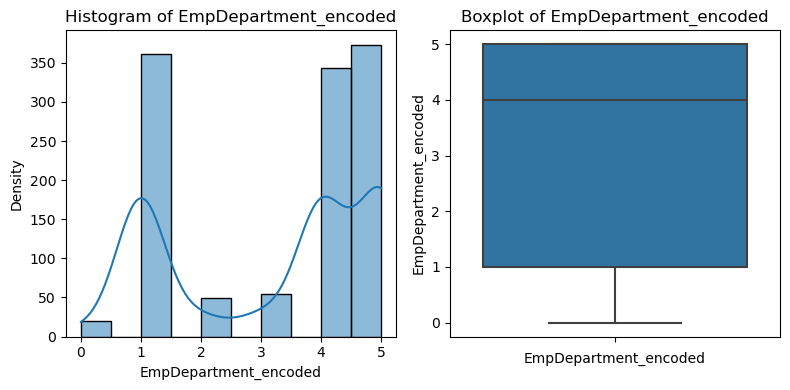

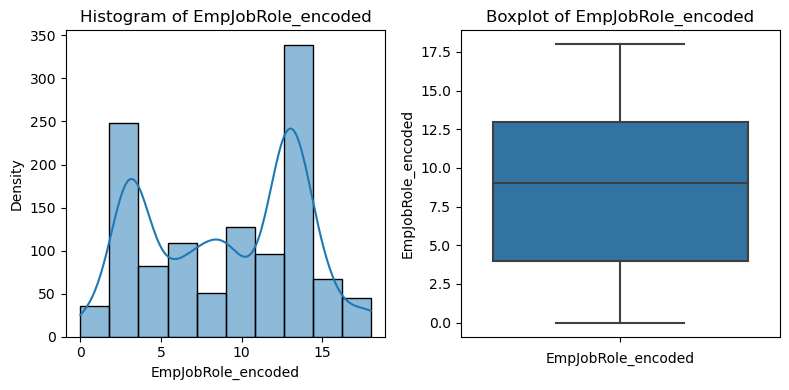

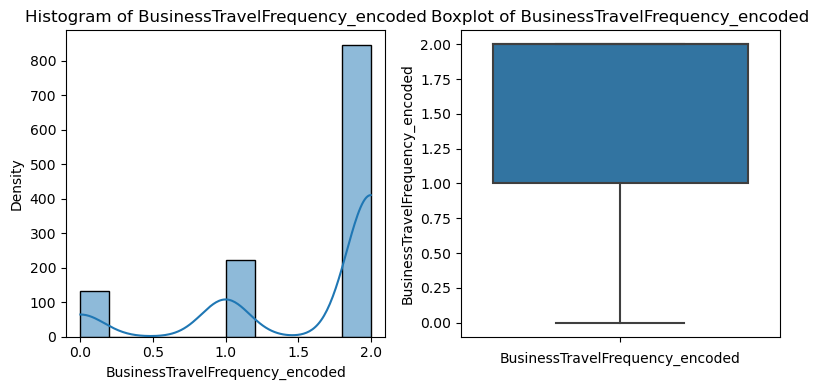

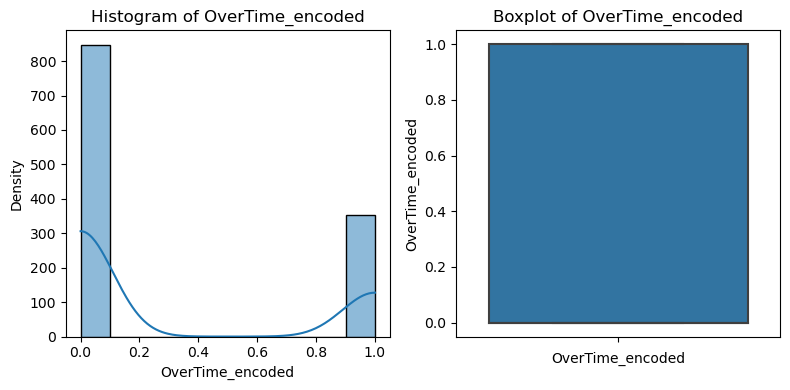

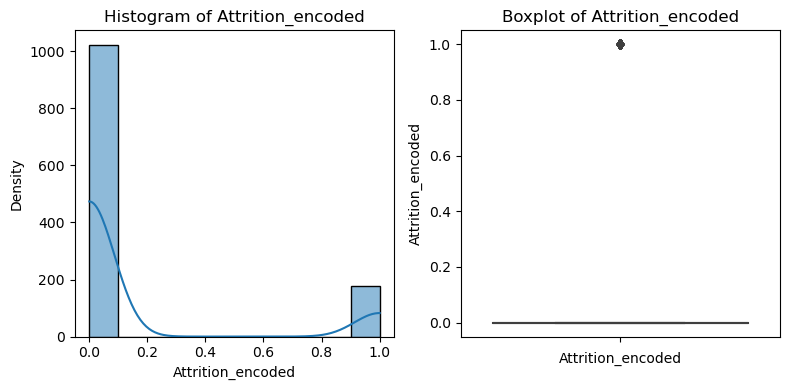

In [97]:
for column in a.columns:
    fig, axs=plt.subplots(1,2, figsize=(8,4))
    sns.histplot(a[column],bins=10,kde=True,ax=axs[0])
    axs[0].set_title(f"Histogram of {column}")
    axs[0].set_xlabel(column)
    axs[0].set_ylabel("Density")
    
    sns.boxplot(y=a[column],ax=axs[1])
    axs[1].set_title(f"Boxplot of {column}")
    axs[1].set_xlabel(column)
    plt.tight_layout()
    plt.show()

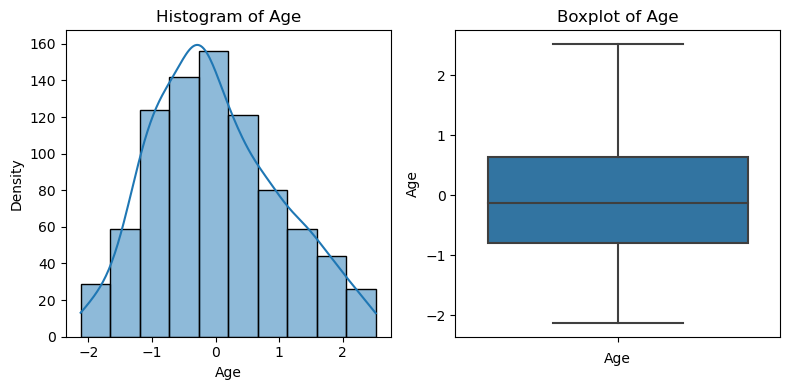

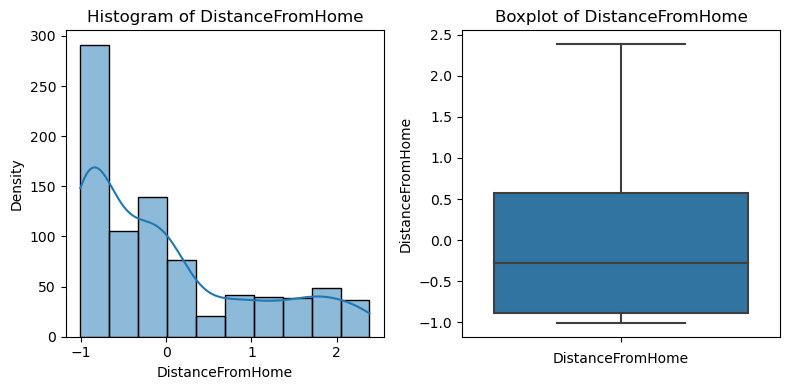

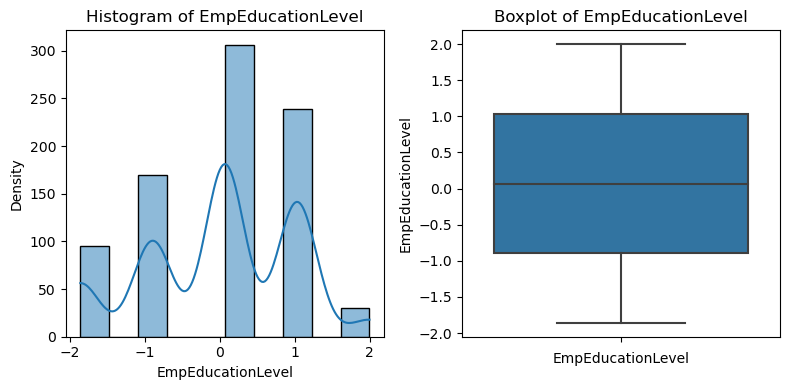

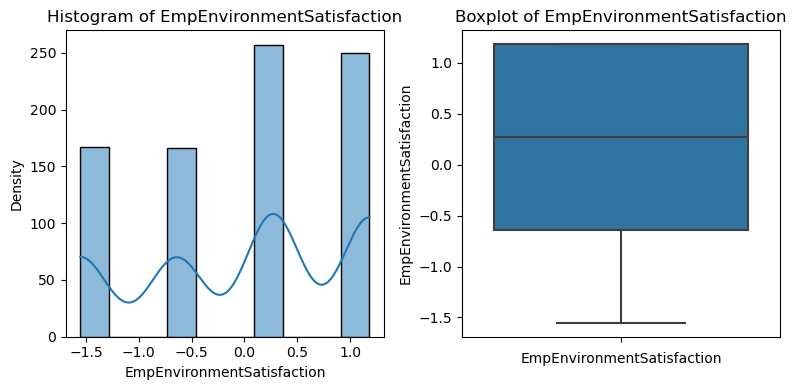

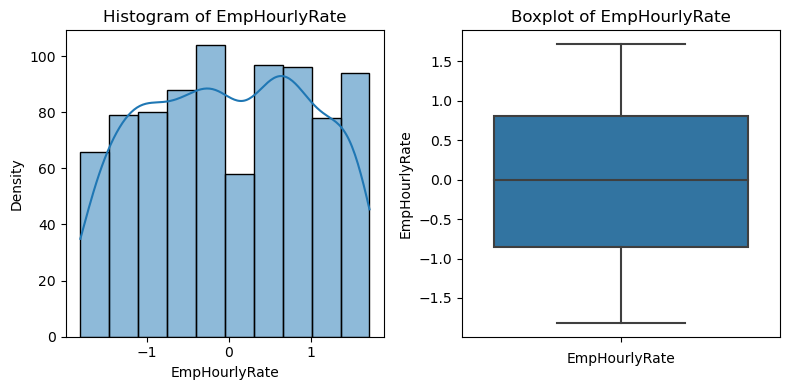

...

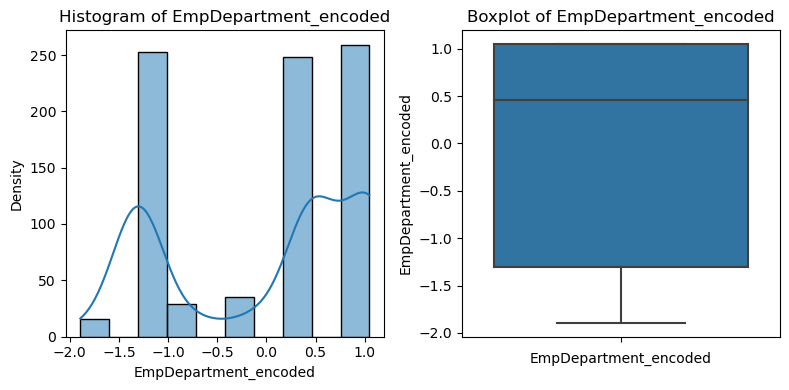

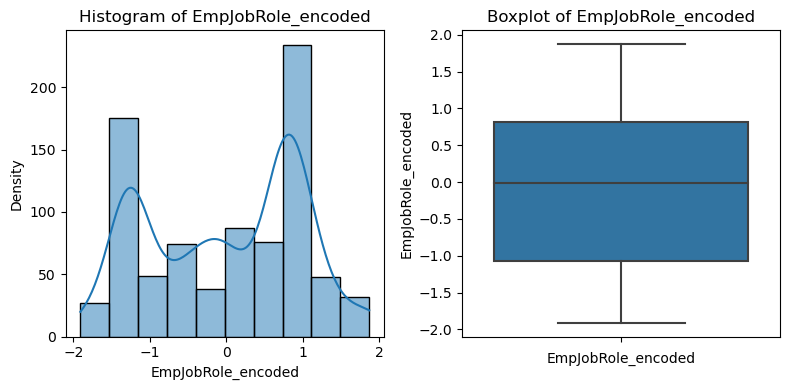

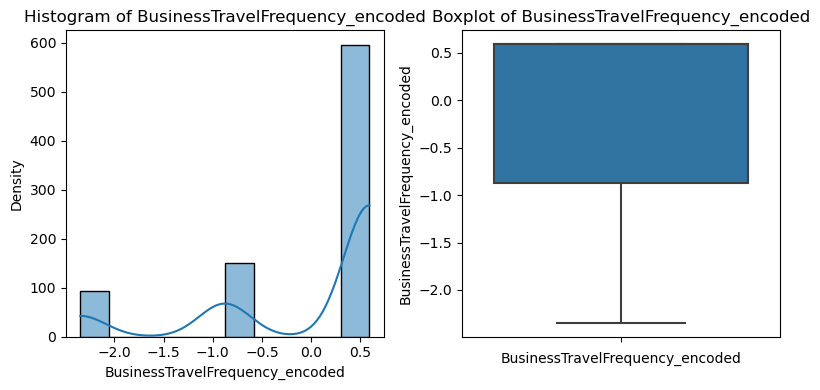

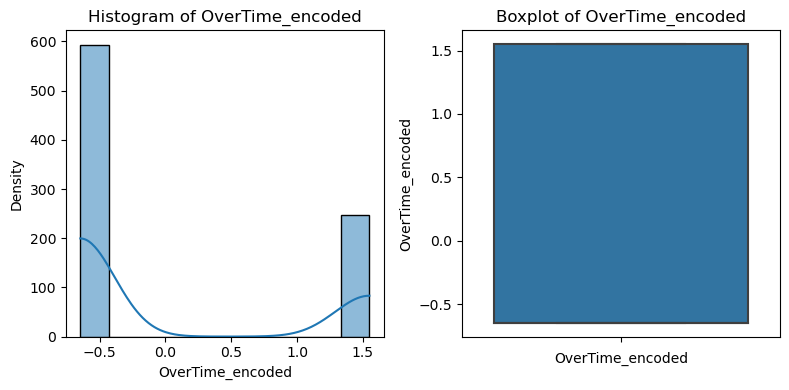

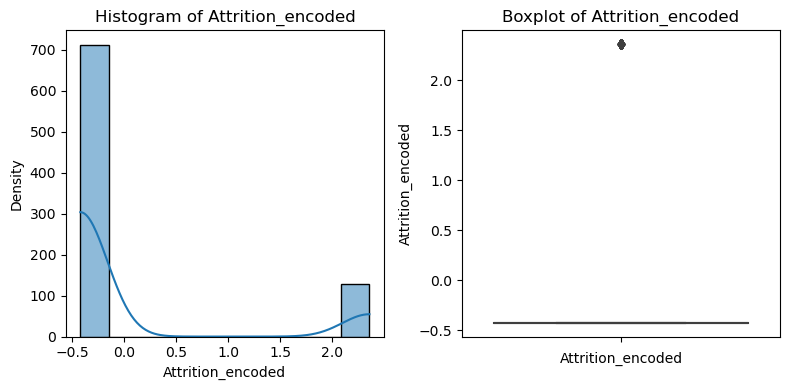

In [98]:
for column in x_train_scaled.columns:
    fig, axs=plt.subplots(1,2, figsize=(8,4))
    sns.histplot(x_train_scaled[column],bins=10,kde=True,ax=axs[0])
    axs[0].set_title(f"Histogram of {column}")
    axs[0].set_xlabel(column)
    axs[0].set_ylabel("Density")
    
    sns.boxplot(y=x_train_scaled[column],ax=axs[1])
    axs[1].set_title(f"Boxplot of {column}")
    axs[1].set_xlabel(column)
    plt.tight_layout()
    plt.show()
 

In [99]:
f=a.skew() # getting the data for data skewness.
f

Age                                0.384145
DistanceFromHome                   0.962956
EmpEducationLevel                 -0.250974
EmpEnvironmentSatisfaction        -0.307665
EmpHourlyRate                     -0.035165
EmpJobInvolvement                 -0.557846
EmpJobLevel                        1.024053
EmpJobSatisfaction                -0.324276
NumCompaniesWorked                 1.048635
EmpLastSalaryHikePercent           0.808654
EmpRelationshipSatisfaction       -0.318563
TotalWorkExperienceInYears         1.086862
TrainingTimesLastYear              0.532073
EmpWorkLifeBalance                -0.539231
ExperienceYearsAtThisCompany       1.789055
ExperienceYearsInCurrentRole       0.888159
YearsSinceLastPromotion            1.974932
YearsWithCurrManager               0.813158
PerformanceRating                 -0.070576
EmpNumber_encoded                  0.000000
Gender_encoded                    -0.426548
EducationBackground_encoded        0.552065
MaritalStatus_encoded           

# The dataset are having Skewed data in it and we are trying to find it.

In [100]:
left_skewed = []  # Empty list for left skewness
right_skewed = [] # Empty list for right skewness
approximately_symmetric = []  # Empty list for another skewness data.

for column in a.columns:
    skewness = a[column].skew()
    if skewness < -1:
        left_skewed.append(column)
    elif skewness > 1:
        right_skewed.append(column)
    else:
        approximately_symmetric.append(column)

print("Left-skewed columns:", left_skewed)
print("Right-skewed columns:", right_skewed)
print("Approximately symmetric columns:", approximately_symmetric)

Left-skewed columns: ['BusinessTravelFrequency_encoded']
Right-skewed columns: ['EmpJobLevel', 'NumCompaniesWorked', 'TotalWorkExperienceInYears', 'ExperienceYearsAtThisCompany', 'YearsSinceLastPromotion', 'Attrition_encoded']
Approximately symmetric columns: ['Age', 'DistanceFromHome', 'EmpEducationLevel', 'EmpEnvironmentSatisfaction', 'EmpHourlyRate', 'EmpJobInvolvement', 'EmpJobSatisfaction', 'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction', 'TrainingTimesLastYear', 'EmpWorkLifeBalance', 'ExperienceYearsInCurrentRole', 'YearsWithCurrManager', 'PerformanceRating', 'EmpNumber_encoded', 'Gender_encoded', 'EducationBackground_encoded', 'MaritalStatus_encoded', 'EmpDepartment_encoded', 'EmpJobRole_encoded', 'OverTime_encoded']


In [101]:
print("Left-skewed columns:", left_skewed) # we only have one column that are left skewed.

Left-skewed columns: ['BusinessTravelFrequency_encoded']


In [102]:
o=a['BusinessTravelFrequency_encoded']
o=pd.DataFrame(o)

In [103]:
from sklearn.preprocessing import PowerTransformer
pt=PowerTransformer()
for column in o.columns:
    x_train_scaled=pt.fit_transform(x_train_scaled)
    x_test_scaled=pt.transform(x_test_scaled)
x_train_scaled=pd.DataFrame(x_train_scaled,columns=x_train.columns,index=x_train.index)
x_test_scaled=pd.DataFrame(x_test_scaled,columns=x_test.columns,index=x_test.index)

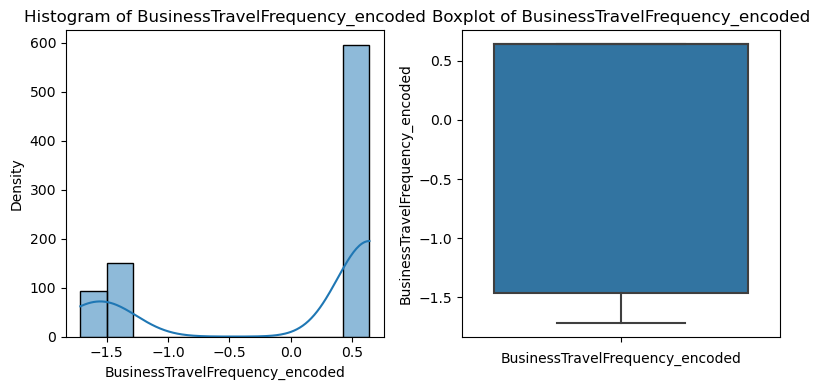

In [104]:
fig, axs=plt.subplots(1,2, figsize=(8,4))
sns.histplot(x_train_scaled['BusinessTravelFrequency_encoded'],kde=True,ax=axs[0])
axs[0].set_title(f"Histogram of BusinessTravelFrequency_encoded")
axs[0].set_xlabel('BusinessTravelFrequency_encoded')
axs[0].set_ylabel("Density")
    
sns.boxplot(y=x_train_scaled['BusinessTravelFrequency_encoded'],ax=axs[1])
axs[1].set_title(f"Boxplot of BusinessTravelFrequency_encoded")
axs[1].set_xlabel('BusinessTravelFrequency_encoded')
plt.tight_layout()
plt.show()

# Insights :


### The above figure shows you how this feature is left skewed.

In [105]:
print("Right-skewed columns:", right_skewed) # We have many columns that were right skewed.

Right-skewed columns: ['EmpJobLevel', 'NumCompaniesWorked', 'TotalWorkExperienceInYears', 'ExperienceYearsAtThisCompany', 'YearsSinceLastPromotion', 'Attrition_encoded']


In [106]:
Q=a[['EmpJobLevel', 'NumCompaniesWorked', 'TotalWorkExperienceInYears', 'ExperienceYearsAtThisCompany', 'YearsSinceLastPromotion']]

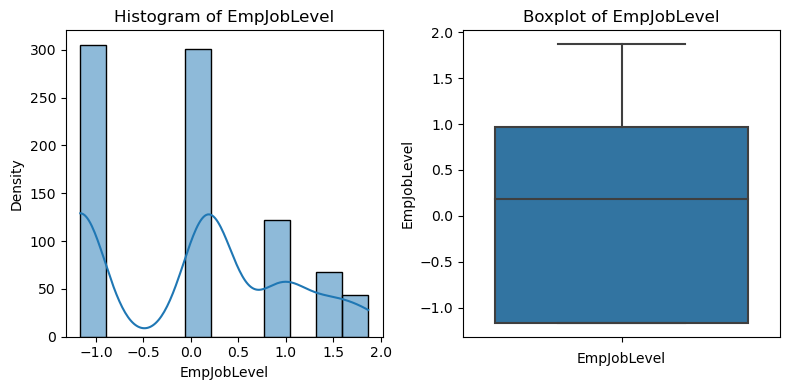

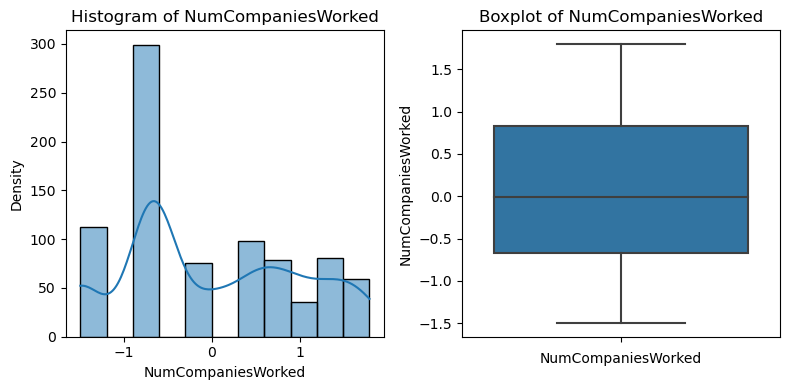

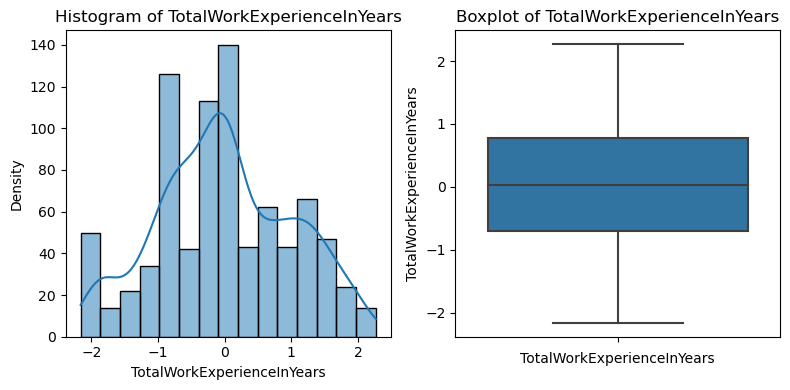

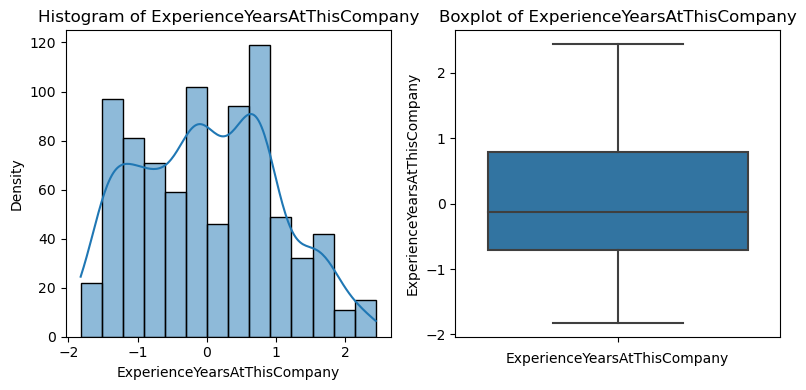

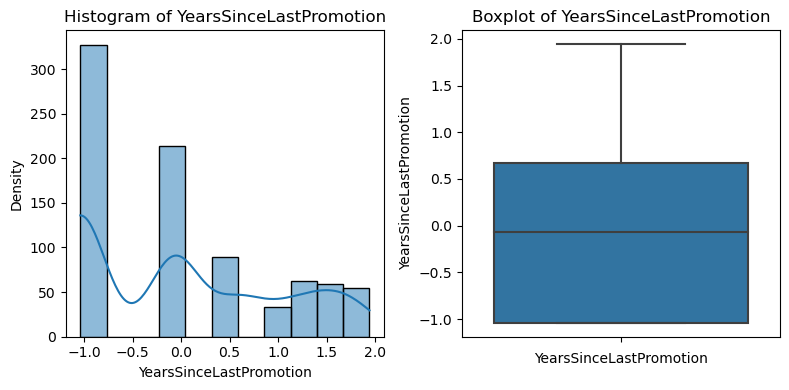

In [107]:
for column in Q.columns:
    fig, axs=plt.subplots(1,2, figsize=(8,4))
    sns.histplot(x_train_scaled[column],kde=True,ax=axs[0])
    axs[0].set_title(f"Histogram of {column}")
    axs[0].set_xlabel(column)
    axs[0].set_ylabel("Density")
    
    sns.boxplot(y=x_train_scaled[column],ax=axs[1])
    axs[1].set_title(f"Boxplot of {column}")
    axs[1].set_xlabel(column)
    plt.tight_layout()
    plt.show()

# Insights :


### The above figures will shows how these features were right skewed.

In [108]:
x_train_scaled.isnull().sum()

Age                                0
DistanceFromHome                   0
EmpEducationLevel                  0
EmpEnvironmentSatisfaction         0
EmpHourlyRate                      0
EmpJobInvolvement                  0
EmpJobLevel                        0
EmpJobSatisfaction                 0
NumCompaniesWorked                 0
EmpLastSalaryHikePercent           0
EmpRelationshipSatisfaction        0
TotalWorkExperienceInYears         0
TrainingTimesLastYear              0
EmpWorkLifeBalance                 0
ExperienceYearsAtThisCompany       0
ExperienceYearsInCurrentRole       0
YearsSinceLastPromotion            0
YearsWithCurrManager               0
EmpNumber_encoded                  0
Gender_encoded                     0
EducationBackground_encoded        0
MaritalStatus_encoded              0
EmpDepartment_encoded              0
EmpJobRole_encoded                 0
BusinessTravelFrequency_encoded    0
OverTime_encoded                   0
Attrition_encoded                  0
d

# Using the Winzorization Method : To remove the Outliers'

# Transforming non-normal Distribution into Normal Distribution :

In [109]:
from scipy.stats.mstats import winsorize
from sklearn.preprocessing import PowerTransformer
for column in a.columns:
    pt=PowerTransformer(method='yeo-johnson',standardize=False)
    x_train_scaled=pt.fit_transform(x_train_scaled)
    x_test_scaled=pt.transform(x_test_scaled)



In [110]:
x_train_scaled=pd.DataFrame(x_train_scaled,columns=x_train.columns,index=x_train.index)
x_test_scaled=pd.DataFrame(x_test_scaled,columns=x_test.columns,index=x_test.index)

In [111]:
x_train_scaled.isnull().sum()

Age                                0
DistanceFromHome                   0
EmpEducationLevel                  0
EmpEnvironmentSatisfaction         0
EmpHourlyRate                      0
EmpJobInvolvement                  0
EmpJobLevel                        0
EmpJobSatisfaction                 0
NumCompaniesWorked                 0
EmpLastSalaryHikePercent           0
EmpRelationshipSatisfaction        0
TotalWorkExperienceInYears         0
TrainingTimesLastYear              0
EmpWorkLifeBalance                 0
ExperienceYearsAtThisCompany       0
ExperienceYearsInCurrentRole       0
YearsSinceLastPromotion            0
YearsWithCurrManager               0
EmpNumber_encoded                  0
Gender_encoded                     0
EducationBackground_encoded        0
MaritalStatus_encoded              0
EmpDepartment_encoded              0
EmpJobRole_encoded                 0
BusinessTravelFrequency_encoded    0
OverTime_encoded                   0
Attrition_encoded                  0
d

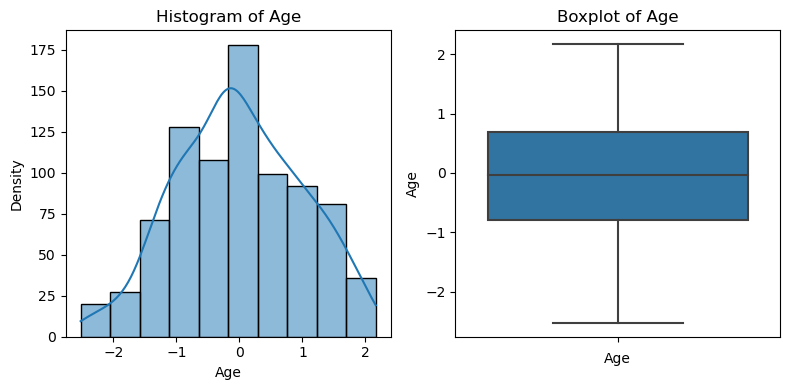

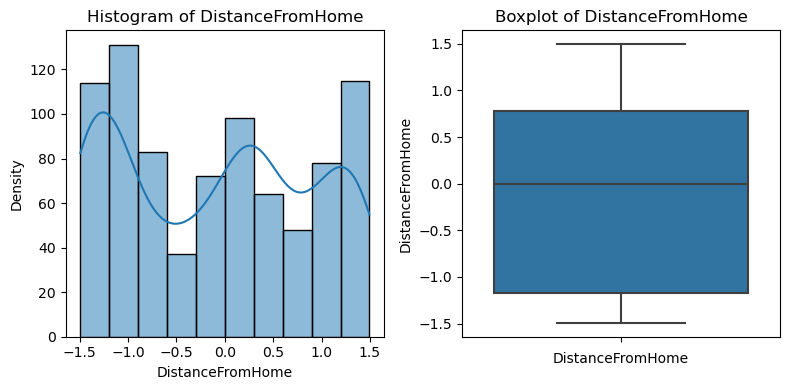

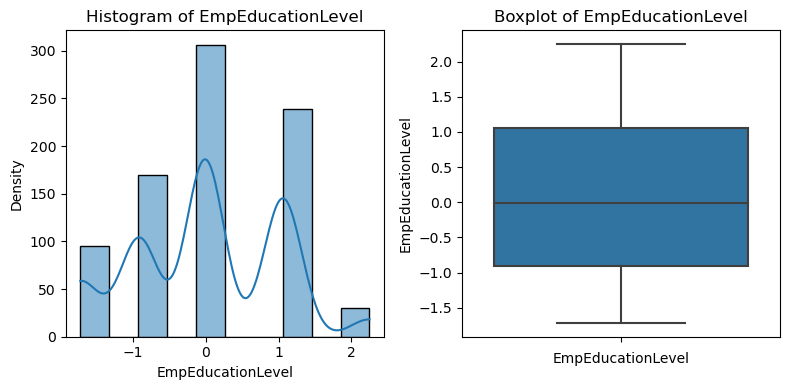

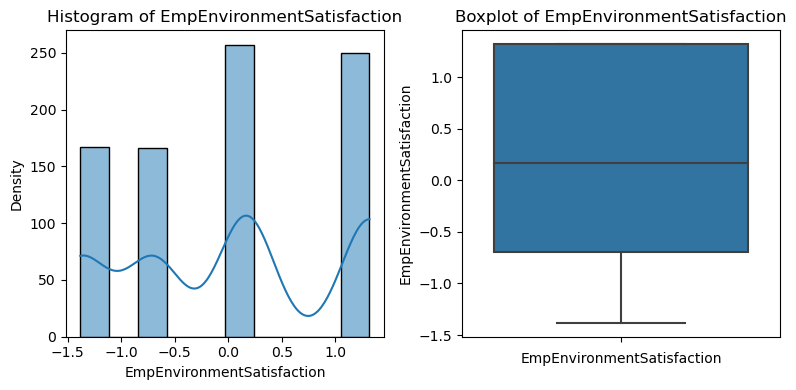

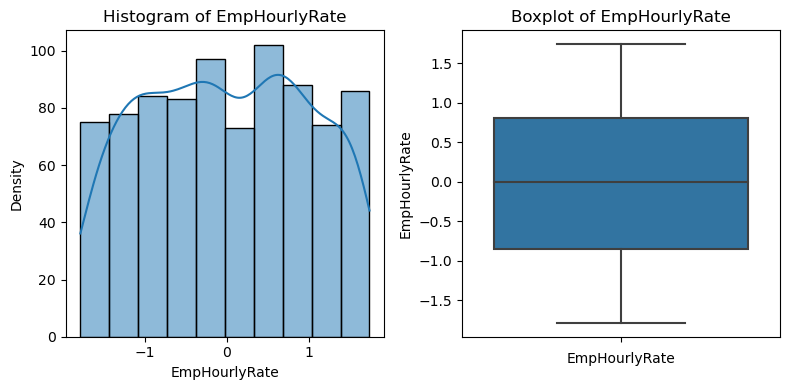

...

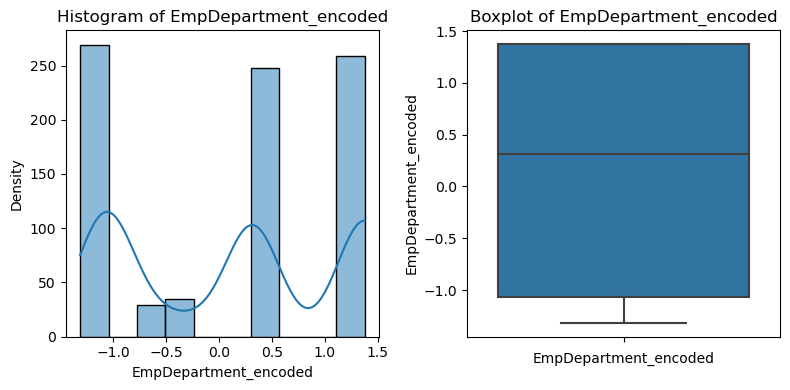

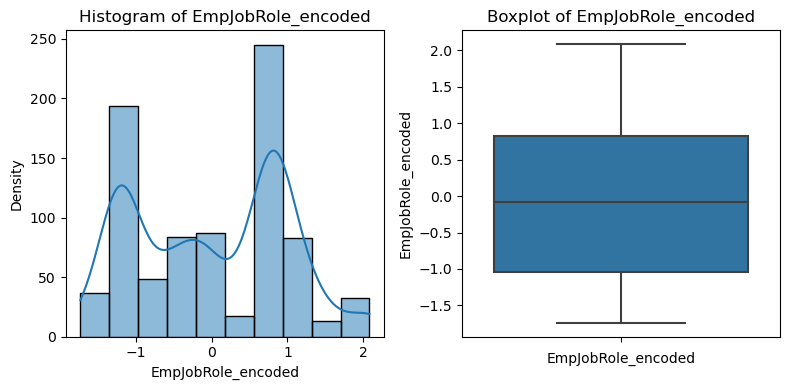

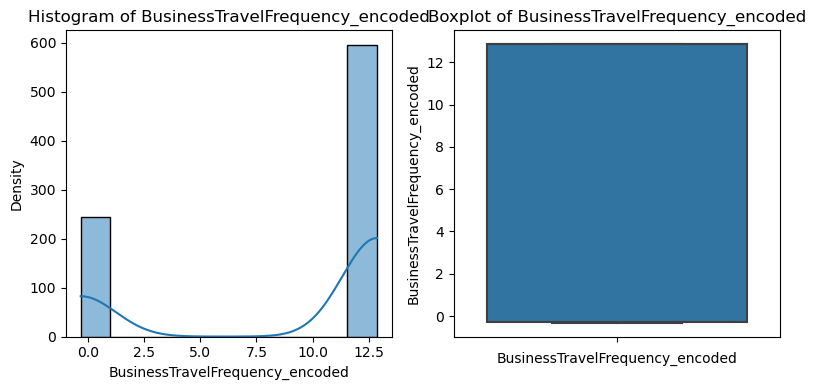

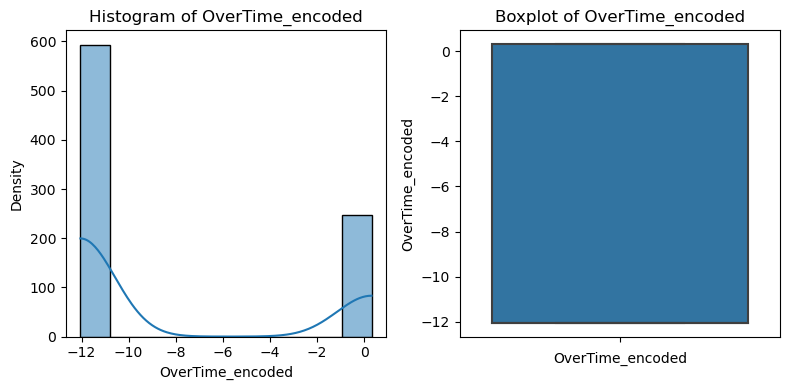

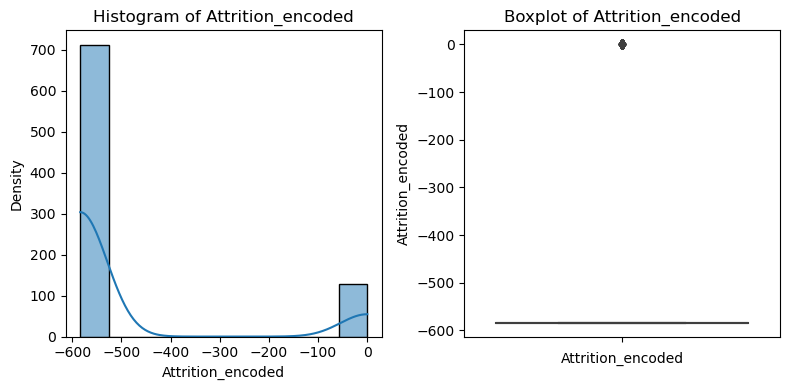

In [112]:
for column in x_train_scaled.columns:
    fig, axs=plt.subplots(1,2, figsize=(8,4))
    sns.histplot(x_train_scaled[column],bins=10,kde=True,ax=axs[0])
    axs[0].set_title(f"Histogram of {column}")
    axs[0].set_xlabel(column)
    axs[0].set_ylabel("Density")
    
    sns.boxplot(y=x_train_scaled[column],ax=axs[1])
    axs[1].set_title(f"Boxplot of {column}")
    axs[1].set_xlabel(column)
    plt.tight_layout()
    plt.show()

# Insights :

### Here we are getting some of the columns and we are work on them for the outliers.

In [113]:
x_train_scaled['NumCompaniesWorked']= winsorize(x_train_scaled['NumCompaniesWorked'],limits=[None,0.05])

<Axes: xlabel='NumCompaniesWorked'>

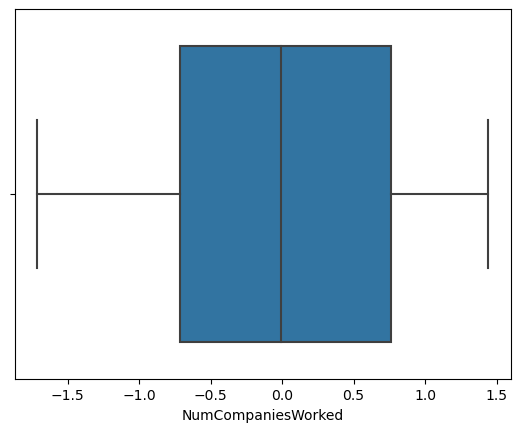

In [114]:
sns.boxplot(x=x_train_scaled['NumCompaniesWorked'])

# Insights :


### We can be able to see that the outliers were now removed.

In [115]:
x_train_scaled['TotalWorkExperienceInYears']= winsorize(x_train_scaled['TotalWorkExperienceInYears'],limits=[0.03,0.05])

<Axes: xlabel='TotalWorkExperienceInYears'>

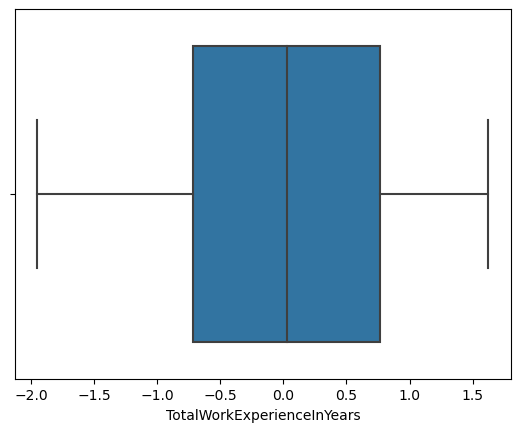

In [116]:
sns.boxplot(x=x_train_scaled['TotalWorkExperienceInYears'])

# Insights :


### We can be able to see that the outliers were now removed.

In [117]:
x_train_scaled['ExperienceYearsAtThisCompany']= winsorize(x_train_scaled['ExperienceYearsAtThisCompany'],limits=[None,0.05])

<Axes: xlabel='ExperienceYearsAtThisCompany'>

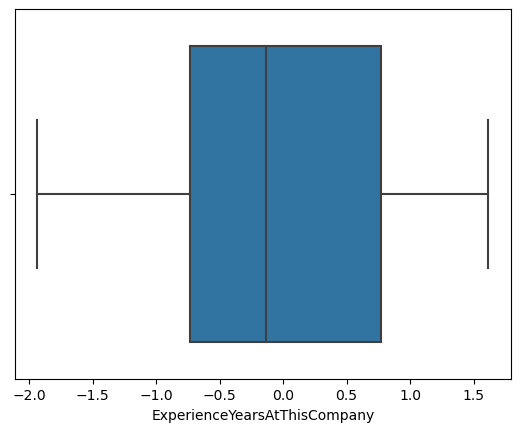

In [118]:
sns.boxplot(x=x_train_scaled['ExperienceYearsAtThisCompany'])

# Insights :


### We can be able to see that the outliers were now removed.

In [119]:
x_train_scaled['YearsSinceLastPromotion']= winsorize(x_train_scaled['YearsSinceLastPromotion'],limits=[None,0.05])

<Axes: xlabel='YearsSinceLastPromotion'>

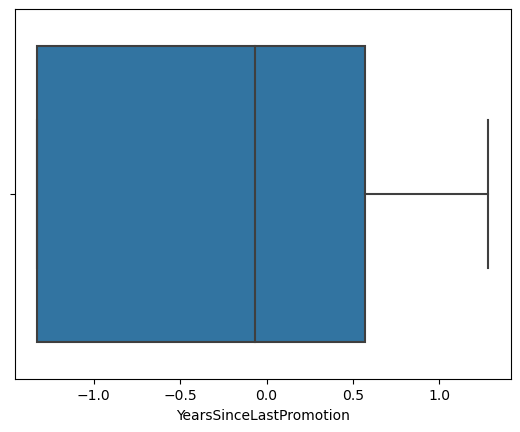

In [120]:
sns.boxplot(x=x_train_scaled['YearsSinceLastPromotion'])

# Insights :


### We can be able to see that the outliers were now removed.

In [121]:
x_train_scaled['YearsSinceLastPromotion']= winsorize(x_train_scaled['YearsSinceLastPromotion'],limits=[None,0.05])

<Axes: xlabel='YearsSinceLastPromotion'>

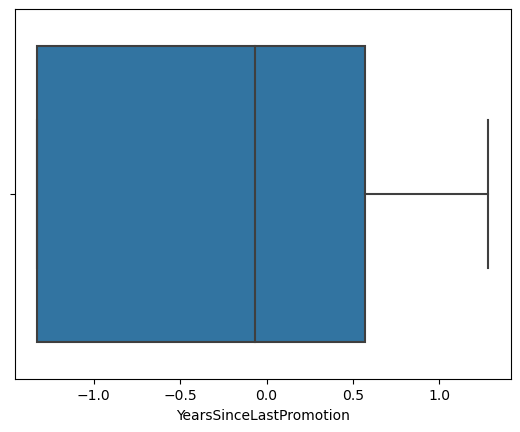

In [122]:
sns.boxplot(x=x_train_scaled['YearsSinceLastPromotion'])

# Insights :


### We can be able to see that the outliers were now removed.

# We have previously figured out that some of the other features that were not either left or right skewed.
# So here we are performing some actions on these features.

In [123]:
print("Approximately symmetric columns:", approximately_symmetric)

Approximately symmetric columns: ['Age', 'DistanceFromHome', 'EmpEducationLevel', 'EmpEnvironmentSatisfaction', 'EmpHourlyRate', 'EmpJobInvolvement', 'EmpJobSatisfaction', 'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction', 'TrainingTimesLastYear', 'EmpWorkLifeBalance', 'ExperienceYearsInCurrentRole', 'YearsWithCurrManager', 'PerformanceRating', 'EmpNumber_encoded', 'Gender_encoded', 'EducationBackground_encoded', 'MaritalStatus_encoded', 'EmpDepartment_encoded', 'EmpJobRole_encoded', 'OverTime_encoded']


In [124]:
Symmetric =a[['Age', 'DistanceFromHome', 'EmpEducationLevel', 'EmpEnvironmentSatisfaction',
      'EmpHourlyRate', 'EmpJobInvolvement', 'EmpJobSatisfaction', 'EmpLastSalaryHikePercent', 
      'EmpRelationshipSatisfaction', 'TrainingTimesLastYear', 'EmpWorkLifeBalance', 
      'ExperienceYearsInCurrentRole', 'YearsWithCurrManager', 'PerformanceRating', 
      'EmpNumber_encoded', 'Gender_encoded', 'EducationBackground_encoded', 'MaritalStatus_encoded', 
      'EmpDepartment_encoded', 'EmpJobRole_encoded', 'OverTime_encoded']]

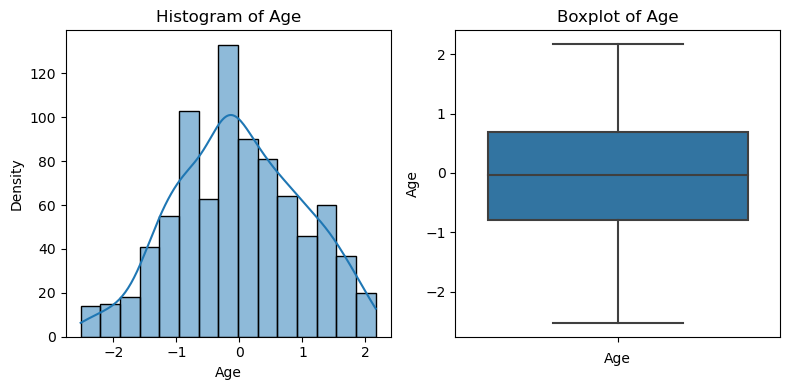

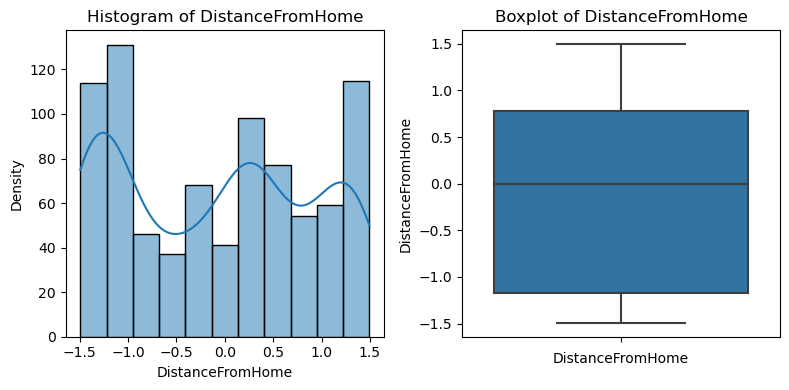

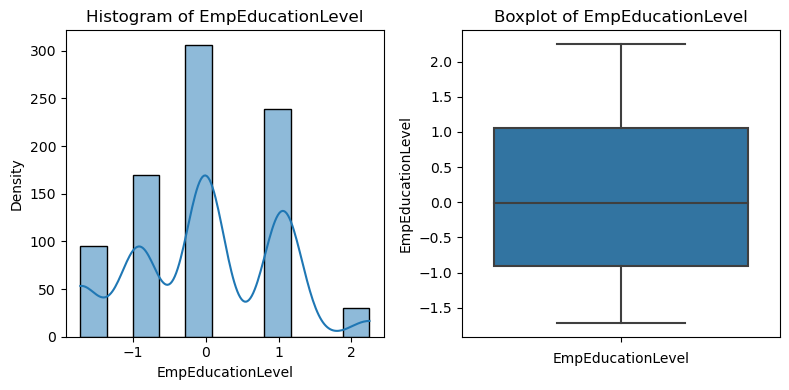

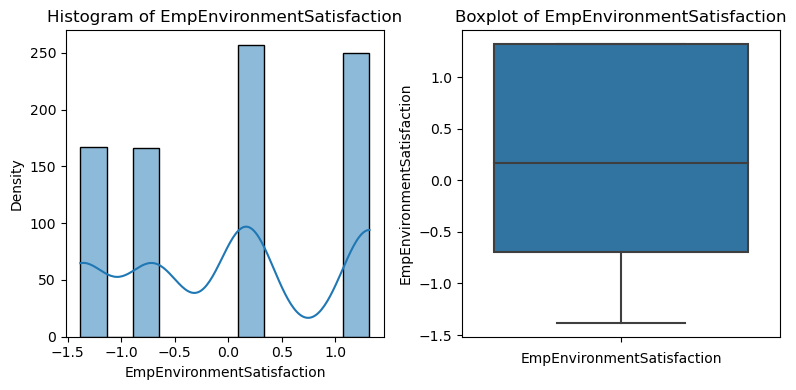

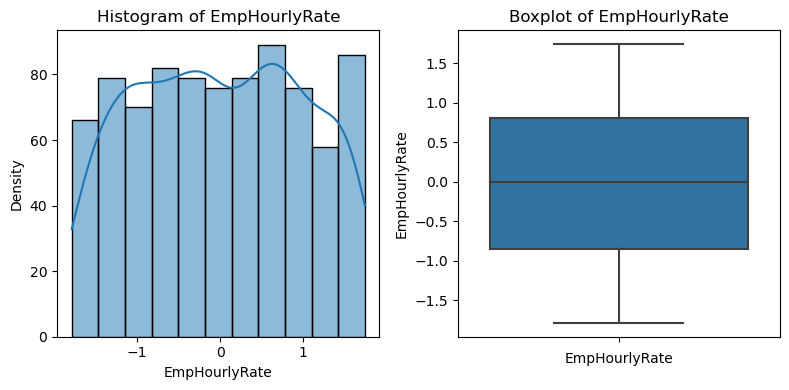

...

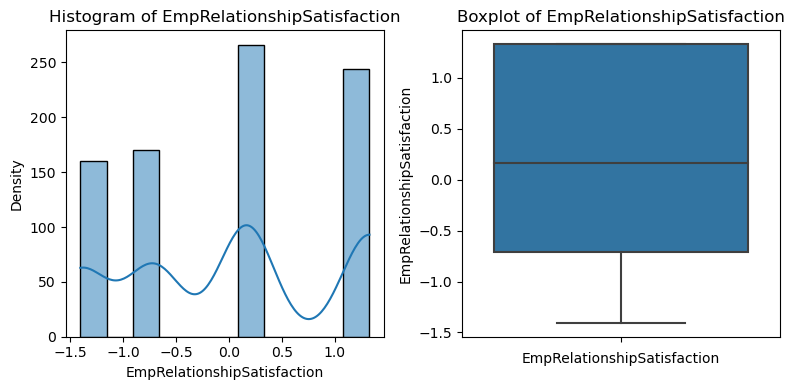

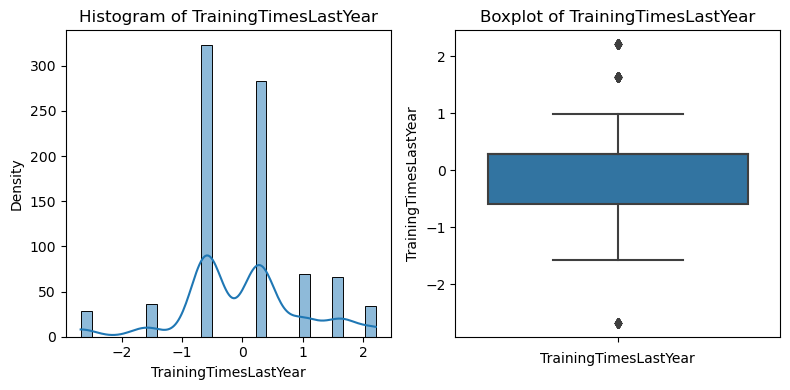

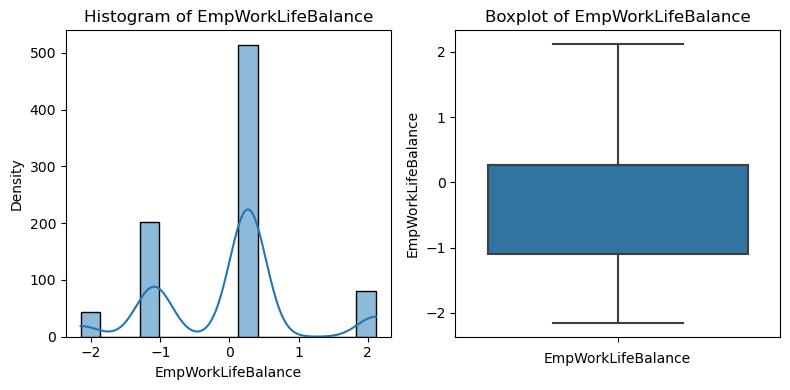

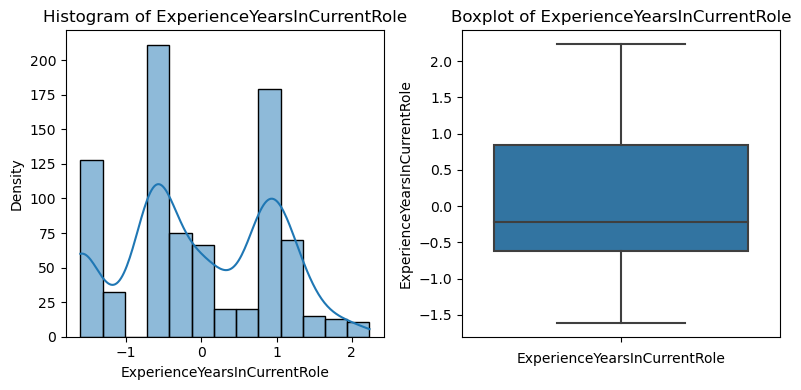

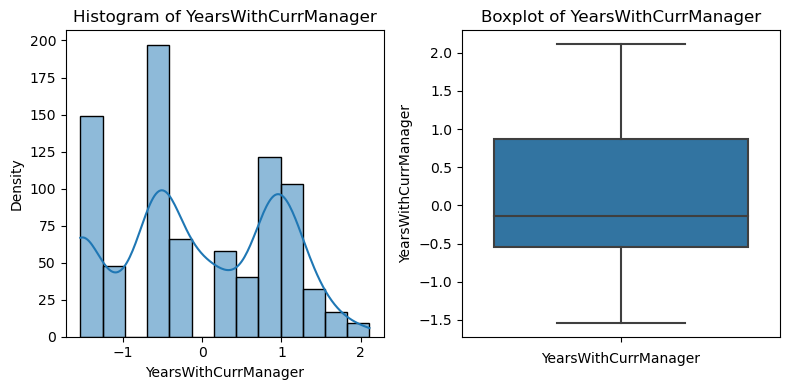

KeyError: 'PerformanceRating'

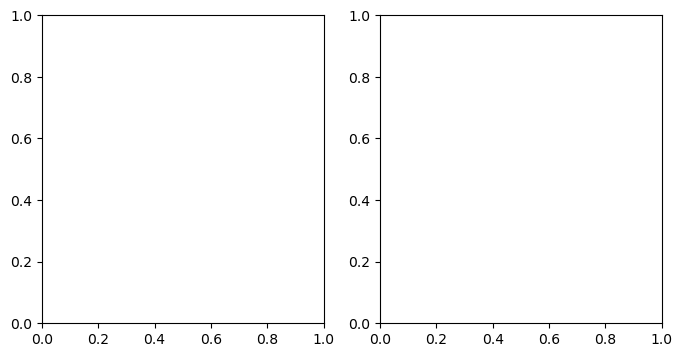

In [125]:
for column in Symmetric.columns:
    fig, axs=plt.subplots(1,2, figsize=(8,4))
    sns.histplot(x_train_scaled[column],kde=True,ax=axs[0])
    axs[0].set_title(f"Histogram of {column}")
    axs[0].set_xlabel(column)
    axs[0].set_ylabel("Density")
    
    sns.boxplot(y=x_train_scaled[column],ax=axs[1])
    axs[1].set_title(f"Boxplot of {column}")
    axs[1].set_xlabel(column)
    plt.tight_layout()
    plt.show()

In [126]:
from scipy import stats

In [127]:
x_train_scaled['ExperienceYearsInCurrentRole']= winsorize(x_train_scaled['ExperienceYearsInCurrentRole'],limits=[None,0.15])

<Axes: xlabel='ExperienceYearsInCurrentRole'>

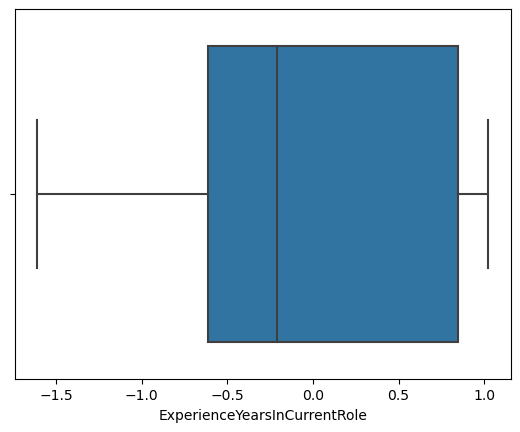

In [128]:
sns.boxplot(x=x_train_scaled['ExperienceYearsInCurrentRole']) 

# Insights :


### We can be able to see that the outliers were now removed.


In [129]:
x_train_scaled['YearsWithCurrManager']=winsorize(x_train_scaled['YearsWithCurrManager'])

<Axes: xlabel='YearsWithCurrManager'>

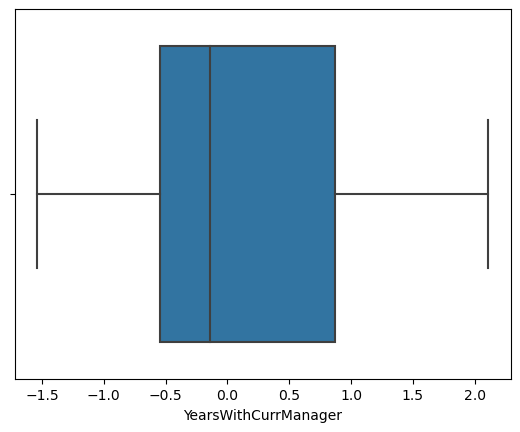

In [130]:
sns.boxplot(x=x_train_scaled['YearsWithCurrManager'])

# Insights :


### We can be able to see that the outliers were now removed.


# Feature Selection'

In [131]:
def get_duplicate_columns(d):
    
    duplicate_columns = {}
    seen_columns = {}

    for column in x_train_scaled.columns:
        current_column = x_train_scaled[column]

        # Convert column data to bytes
        try:
            current_column_hash = current_column.values.tobytes()
        except AttributeError:
            current_column_hash = current_column.to_string().encode()

        if current_column_hash in seen_columns:
            if seen_columns[current_column_hash] in duplicate_columns:
                duplicate_columns[seen_columns[current_column_hash]].append(column)
            else:
                duplicate_columns[seen_columns[current_column_hash]] = [column]
        else:
            seen_columns[current_column_hash] = column

    return duplicate_columns
duplicate_columns = get_duplicate_columns(x_train_scaled)
duplicate_columns


{}

In [132]:
from sklearn.feature_selection import VarianceThreshold  
var_the=VarianceThreshold(threshold=0)
var_the.fit(x_train_scaled)

sum(var_the.get_support())

const_cols=[column for column in x_train_scaled.columns
           if column not in x_train_scaled.columns[var_the.get_support()]]
print(len(const_cols))

var_the.get_support()

for column in const_cols: # means from these we have to derive the new columns 
    print(column)

0


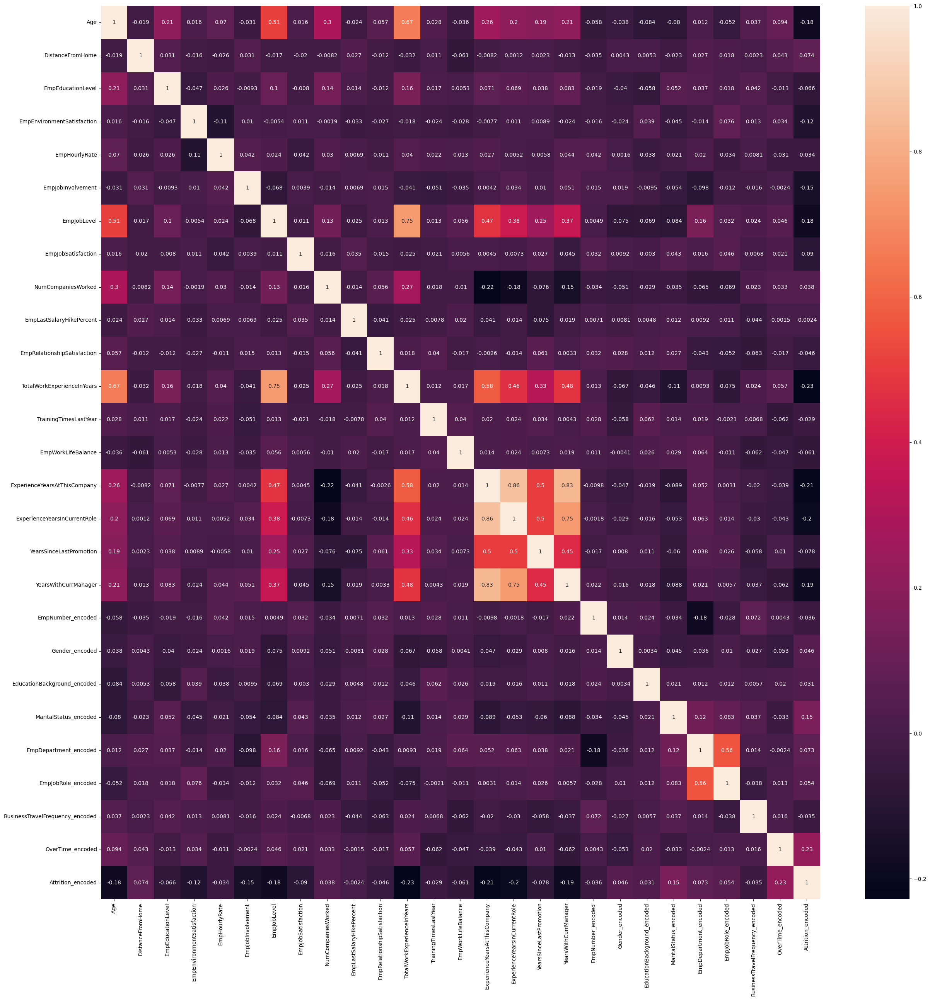

In [133]:
plt.figure(figsize=(30,30))
sns.heatmap(x_train_scaled.corr(), annot=True)
plt.show()

# Insights :

### Many of features have relatively lower positive correlations with the target. Whether to keep or drop them depends on your specific modeling objectives and the importance of these features in our domain Knowledge.



# Checking the Correlated Features'

In [134]:
def correlation(x_train_scaled,threshold):
    col_corr=set()  # creating empty set
    corr_matrix = x_train_scaled.corr().abs()#abs for absolute error
    for i in range (len(corr_matrix.columns)): 
        for j in range(i):
            if corr_matrix.iloc[i,j] > threshold:
                colname=corr_matrix.columns[i]
                col_corr.add(colname)
    return col_corr


corr_feature=correlation(x_train_scaled,0.85)
len(set(corr_feature))

corr_feature

{'ExperienceYearsInCurrentRole'}

# Insights :

### We have found one correlated column.

In [135]:
x_train_scaled.shape

(840, 27)

# Selecting the Best features'

In [136]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import train_test_split

# Assuming x_train_scaled, x_test_scaled, y_train, y_test are already defined

num_features = 15  # Number of top features to select

# Initialize SelectKBest with mutual_info_classif as score function
selector = SelectKBest(score_func=mutual_info_classif, k=num_features)

# Fit the selector on the training data
selector.fit(x_train_scaled, y_train)

# Get the indices of the selected features
selected_features_indices = selector.get_support(indices=True)

# Get the names of the selected features
selected_feature_names = x_train_scaled.columns[selected_features_indices]

# Create feature matrices containing the selected features for both training and test sets
x_train_scaled = x_train_scaled[selected_feature_names]
x_test_scaled = x_test_scaled[selected_feature_names]

# Use the selected features in your machine learning pipeline
# ... (continue with your machine learning model training using x_train_selected and x_test_selected)


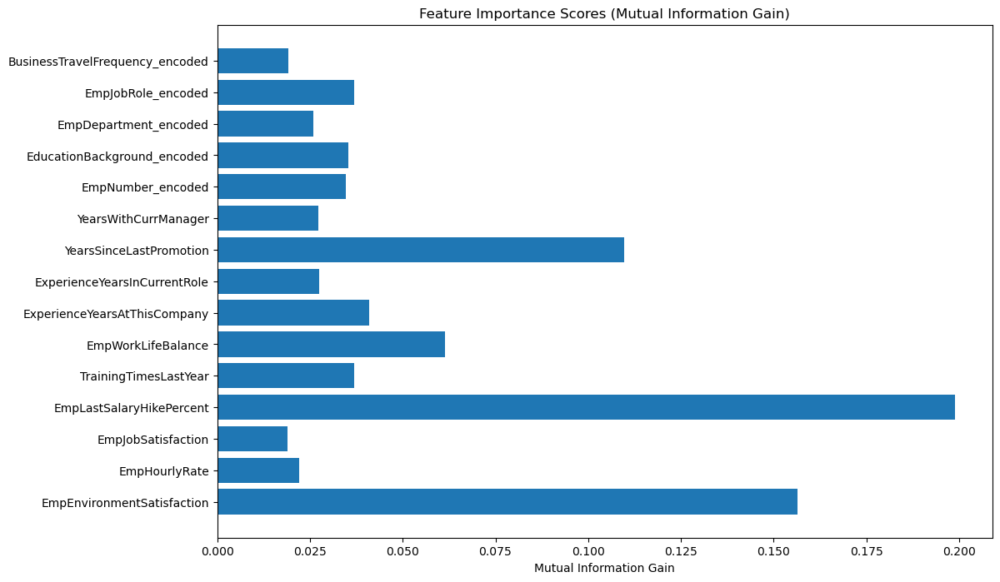

In [137]:
plt.figure(figsize=(12, 8))
plt.barh(range(len(selected_feature_names)), selector.scores_[selected_features_indices], align='center')
plt.yticks(range(len(selected_feature_names)), selected_feature_names)
plt.xlabel('Mutual Information Gain')

plt.title('Feature Importance Scores (Mutual Information Gain)')
plt.show()

# Insights :


### As we can see, the most important variables to predict the Customer Satisfaction for a Customers are the different Columns. This makes sense, since the most commonn factor for score prediction Attrition type.
### The feature importance also shows that nearly all binary variables have a low feature importance, meaning they are providing the model with little to no predictive information.
### That implies that most rows are equal to some values.
### Furthermore, it is visible that the binary variables with an average above ten percent have also a higher feature importance within our prediction model.


# Smoting'

In [138]:
from imblearn.over_sampling import SMOTE
smote=SMOTE(random_state=42)
x_train_scaled,y_train=smote.fit_resample(x_train_scaled,y_train)

In [139]:
x_train_scaled.count()

EmpEnvironmentSatisfaction         1842
EmpHourlyRate                      1842
EmpJobSatisfaction                 1842
EmpLastSalaryHikePercent           1842
TrainingTimesLastYear              1842
EmpWorkLifeBalance                 1842
ExperienceYearsAtThisCompany       1842
ExperienceYearsInCurrentRole       1842
YearsSinceLastPromotion            1842
YearsWithCurrManager               1842
EmpNumber_encoded                  1842
EducationBackground_encoded        1842
EmpDepartment_encoded              1842
EmpJobRole_encoded                 1842
BusinessTravelFrequency_encoded    1842
dtype: int64

# PCA'

In [140]:
from sklearn.decomposition import PCA

num_components = 15  # Example: You can specify the number of principal components
pca = PCA(n_components=num_components)
x_train_pca = pca.fit_transform(x_train_scaled)
x_test_pca = pca.transform(x_test_scaled)
explained_var_ratio = pca.explained_variance_ratio_


In [141]:
x_train_pca=pd.DataFrame(x_train_pca,columns=x_train_scaled.columns,index=x_train_scaled.index)
x_test_pca=pd.DataFrame(x_test_pca,columns=x_test_scaled.columns,index=x_test_scaled.index)

In [142]:
x_train_pca.shape

(1842, 15)

In [143]:
x_train_pca.info()
x_test_pca.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1842 entries, 0 to 1841
Data columns (total 15 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   EmpEnvironmentSatisfaction       1842 non-null   float64
 1   EmpHourlyRate                    1842 non-null   float64
 2   EmpJobSatisfaction               1842 non-null   float64
 3   EmpLastSalaryHikePercent         1842 non-null   float64
 4   TrainingTimesLastYear            1842 non-null   float64
 5   EmpWorkLifeBalance               1842 non-null   float64
 6   ExperienceYearsAtThisCompany     1842 non-null   float64
 7   ExperienceYearsInCurrentRole     1842 non-null   float64
 8   YearsSinceLastPromotion          1842 non-null   float64
 9   YearsWithCurrManager             1842 non-null   float64
 10  EmpNumber_encoded                1842 non-null   float64
 11  EducationBackground_encoded      1842 non-null   float64
 12  EmpDepartment_encode

In [144]:
y_train.shape

(1842,)

In [145]:
x_train_pca

,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobSatisfaction,EmpLastSalaryHikePercent,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,EmpNumber_encoded,EducationBackground_encoded,EmpDepartment_encoded,EmpJobRole_encoded,BusinessTravelFrequency_encoded
0,-4.204367,1.197463,-2.630255,0.356367,-0.179563,0.774637,1.284008,-0.047138,0.102727,-0.429021,-0.791370,0.729064,-0.331018,0.499348,-0.094756
1,-4.147457,-2.279456,-0.034356,0.819874,-0.102015,2.372764,-1.493610,-0.155504,0.693206,2.270252,1.626208,-0.288402,-0.310636,-0.337054,-0.202692
2,-4.219060,-2.217690,0.829049,-0.806623,1.221187,-2.792593,0.599793,1.074789,1.126097,-0.177029,-0.207574,-0.064483,-0.365450,-0.218359,-0.188339
3,9.014482,-0.727493,-0.838565,-0.437881,1.341087,-0.702402,-1.175784,0.166127,1.241978,-0.175415,0.205981,-1.207247,-0.787294,1.979521,1.100760
4,-4.208303,-0.941988,-0.404343,-0.650976,-0.824676,0.171323,1.174155,0.787379,1.141816,1.318316,1.424701,1.377332,-0.042611,-0.042132,-0.437396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1837,-4.215978,3.123287,0.389458,-1.631573,-0.187553,-0.618550,-1.313423,0.447812,-0.282398,0.159260,0.486882,-0.072606,-0.050722,-0.131648,0.147721
1838,-4.171055,0.347752,-0.309848,-1.434880,0.079914,-0.806955,-0.773156,-0.397750,0.056660,-0.139038,-0.229200,-0.177186,-0.298738,0.012864,-0.124044
1839,-4.179197,-0.536648,-0.655788,-1.005133,-0.058143,-0.308320,1.667231,-0.403465,-0.425163,0.156802,1.121499,-0.199030,0.148999,0.319209,0.071267
1840,8.986334,3.161829,0.282752,0.065487,-1.291045,-0.374431,-0.185974,-2.685187,0.527490,-0.478700,-0.744613,0.110391,-0.057095,0.067179,0.214236


In [146]:
x_train_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1842 entries, 0 to 1841
Data columns (total 15 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   EmpEnvironmentSatisfaction       1842 non-null   float64
 1   EmpHourlyRate                    1842 non-null   float64
 2   EmpJobSatisfaction               1842 non-null   float64
 3   EmpLastSalaryHikePercent         1842 non-null   float64
 4   TrainingTimesLastYear            1842 non-null   float64
 5   EmpWorkLifeBalance               1842 non-null   float64
 6   ExperienceYearsAtThisCompany     1842 non-null   float64
 7   ExperienceYearsInCurrentRole     1842 non-null   float64
 8   YearsSinceLastPromotion          1842 non-null   float64
 9   YearsWithCurrManager             1842 non-null   float64
 10  EmpNumber_encoded                1842 non-null   float64
 11  EducationBackground_encoded      1842 non-null   float64
 12  EmpDepartment_encode

In [147]:
y_train.info()

<class 'pandas.core.series.Series'>
RangeIndex: 1842 entries, 0 to 1841
Series name: PerformanceRating
Non-Null Count  Dtype
--------------  -----
1842 non-null   int64
dtypes: int64(1)
memory usage: 14.5 KB


# Insights :


###  Initialize PCA with the number of components you desire in your Model'


# Implementing Models'

# Logistic Regression'

In [148]:
from sklearn.linear_model import LogisticRegression

In [149]:
LR=LogisticRegression()

In [150]:
LR.fit(x_train_pca,y_train)
y1_test=LR.predict(x_test_pca)

In [151]:
from sklearn.metrics import confusion_matrix,accuracy_score,recall_score,precision_score,classification_report,f1_score

In [154]:
recall=recall_score(y_test,y1_test, average='weighted')
recall

0.7805555555555556

In [156]:
f1score=f1_score(y_test,y1_test, average='weighted')
f1score

0.791562071775541

In [157]:
Confusion=confusion_matrix(y_test,y1_test, labels=np.unique(y_test), normalize='true')
Confusion

array([[0.89285714, 0.10714286, 0.        ],
       [0.14230769, 0.76153846, 0.09615385],
       [0.06818182, 0.18181818, 0.75      ]])

In [158]:
accuracy_score(y_test,y1_test)

0.7805555555555556

In [160]:
precision_score(y_test,y1_test, average='weighted')

0.8304882848582698

In [161]:
print(classification_report(y_test,y1_test))

              precision    recall  f1-score   support

           2       0.56      0.89      0.68        56
           3       0.93      0.76      0.84       260
           4       0.57      0.75      0.65        44

    accuracy                           0.78       360
   macro avg       0.69      0.80      0.72       360
weighted avg       0.83      0.78      0.79       360



# ROC Curve'

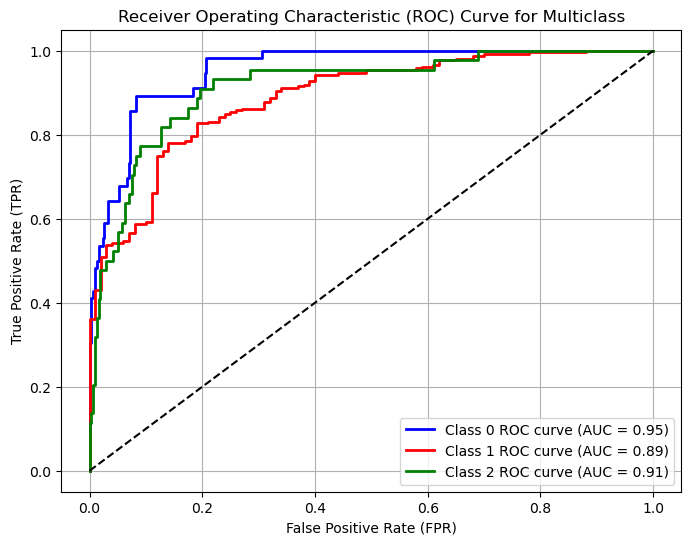

In [174]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Assuming y_test contains the true labels and LR is your fitted Logistic Regression model

# Binarize the labels for multi-class ROC curve
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))

# Predict probabilities for each class
y_test_pred_proba = LR.predict_proba(x_test_pca)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

n_classes = y_test_binarized.shape[1]

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_test_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure(figsize=(8, 6))
colors = ['blue', 'red', 'green', 'orange', 'purple']  # Add more colors if more classes
labels = [f'Class {i} ROC curve (AUC = {roc_auc[i]:.2f})' for i in range(n_classes)]

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label=labels[i])

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve for Multiclass')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Insights :

### The Receiver Operating Characteristic (ROC) curve is a valuable tool in the field of machine learning and statistics, primarily used in binary and multiclass classification problems. Its importance lies in its ability to provide insights into the performance of classification models and their ability to discriminate between classes


# Decision Tree'

In [164]:
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier()

In [165]:
dt.fit(x_train_scaled,y_train)


DecisionTreeClassifier()

In [166]:
dtpre_test=dt.predict(x_test_scaled)

In [167]:
recall=recall_score(y_test,dtpre_test, average='weighted')
recall

0.9083333333333333

In [169]:
accuracy=accuracy_score(y_test,dtpre_test, )
accuracy

0.9083333333333333

In [170]:
precision=precision_score(y_test,dtpre_test, average='weighted')
precision

0.9088167114482903

In [171]:
confusion=confusion_matrix(y_test,dtpre_test, labels=np.unique(y_test), normalize='true')
confusion

array([[0.91071429, 0.07142857, 0.01785714],
       [0.03461538, 0.94230769, 0.02307692],
       [0.06818182, 0.22727273, 0.70454545]])

In [172]:
f1=f1_score(y_test,dtpre_test, average='weighted')
f1


0.9076120953887766

In [173]:
print(classification_report(y_test,dtpre_test))

              precision    recall  f1-score   support

           2       0.81      0.91      0.86        56
           3       0.95      0.94      0.94       260
           4       0.82      0.70      0.76        44

    accuracy                           0.91       360
   macro avg       0.86      0.85      0.85       360
weighted avg       0.91      0.91      0.91       360



# ROC Curve'

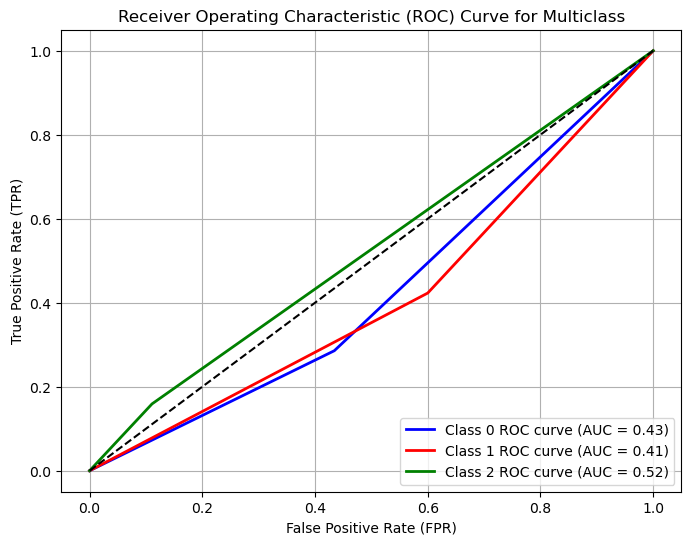

In [175]:
from sklearn.preprocessing import label_binarize

# Assuming y_test contains the true labels and LR is your fitted Logistic Regression model

# Binarize the labels for multi-class ROC curve
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))

# Predict probabilities for each class
y_test_pred_proba = dt.predict_proba(x_test_pca)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

n_classes = y_test_binarized.shape[1]

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_test_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure(figsize=(8, 6))
colors = ['blue', 'red', 'green', 'orange', 'purple']  # Add more colors if more classes
labels = [f'Class {i} ROC curve (AUC = {roc_auc[i]:.2f})' for i in range(n_classes)]

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label=labels[i])

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve for Multiclass')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Insights :

### The Receiver Operating Characteristic (ROC) curve is a valuable tool in the field of machine learning and statistics, primarily used in binary and multiclass classification problems. Its importance lies in its ability to provide insights into the performance of classification models and their ability to discriminate between classes


# Hyperparameter Tuning Of DECISION TREE'

In [176]:
from sklearn.model_selection import GridSearchCV
pram_grid={
    'criterion':['gini','entropy'],
    'max_depth':['None',5,10,15,20],
    'min_samples_split':[2,5,10],
    'min_samples_leaf':[1,2,4]      
}
dtc=DecisionTreeClassifier(random_state=42)
grid_search=GridSearchCV(estimator=dtc,param_grid=pram_grid,cv=5,scoring='accuracy')
grid_search.fit(x_train_pca,y_train)
best_params=grid_search.best_params_
best_score=grid_search.best_score_
best_dtc=DecisionTreeClassifier(**best_params,random_state=42)
best_dtc.fit(x_train_pca,y_train)
yh_pred=best_dtc.predict(x_test_pca)
yh_predtr=best_dtc.predict(x_train_pca)

In [177]:
Confusion=confusion_matrix(y_test,yh_pred, labels=np.unique(y_test), normalize='true')
Confusion

array([[0.64285714, 0.30357143, 0.05357143],
       [0.1       , 0.79230769, 0.10769231],
       [0.13636364, 0.54545455, 0.31818182]])

In [178]:
accuracytr=accuracy_score(y_train,yh_predtr)
accuracytr

1.0

In [179]:
accuracy=accuracy_score(y_test,yh_pred)
accuracy


0.7111111111111111

In [180]:
recall=recall_score(y_test,yh_pred, average='weighted')
recall

0.7111111111111111

In [181]:
precision=precision_score(y_test,yh_pred, average='weighted')
precision

0.7227168138210449

In [182]:
f1=f1_score(y_test,yh_pred, average='weighted')
f1

0.7156691026208967

In [183]:
print(classification_report(y_test,yh_pred))

              precision    recall  f1-score   support

           2       0.53      0.64      0.58        56
           3       0.83      0.79      0.81       260
           4       0.31      0.32      0.31        44

    accuracy                           0.71       360
   macro avg       0.56      0.58      0.57       360
weighted avg       0.72      0.71      0.72       360



# ROC Curve'

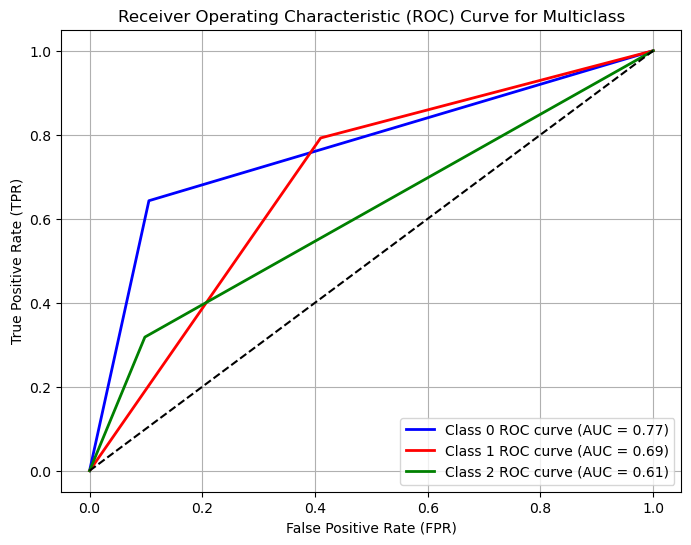

In [185]:
from sklearn.preprocessing import label_binarize

# Assuming y_test contains the true labels and LR is your fitted Logistic Regression model

# Binarize the labels for multi-class ROC curve
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))

# Predict probabilities for each class
y_test_pred_proba = best_dtc.predict_proba(x_test_pca)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

n_classes = y_test_binarized.shape[1]

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_test_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure(figsize=(8, 6))
colors = ['blue', 'red', 'green', 'orange', 'purple']  # Add more colors if more classes
labels = [f'Class {i} ROC curve (AUC = {roc_auc[i]:.2f})' for i in range(n_classes)]

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label=labels[i])

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve for Multiclass')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Insights :

### The Receiver Operating Characteristic (ROC) curve is a valuable tool in the field of machine learning and statistics, primarily used in binary and multiclass classification problems. Its importance lies in its ability to provide insights into the performance of classification models and their ability to discriminate between classes


# Random Forest'

In [186]:
from sklearn.ensemble import RandomForestClassifier

In [187]:
rf=RandomForestClassifier()

In [188]:
rf.fit(x_train_pca,y_train)


RandomForestClassifier()

In [189]:
rfpre_test=rf.predict(x_test_pca)

In [190]:
confusion=confusion_matrix(y_test,rfpre_test, labels=np.unique(y_test), normalize='true')
confusion

array([[0.64285714, 0.33928571, 0.01785714],
       [0.05      , 0.90384615, 0.04615385],
       [0.02272727, 0.63636364, 0.34090909]])

In [191]:
recall=recall_score(y_test,rfpre_test, average='weighted')
recall

0.7944444444444444

In [192]:
precision=precision_score(y_test,rfpre_test, average='weighted')
precision

0.7793280423280423

In [193]:
accuracy=accuracy_score(y_test,rfpre_test)
accuracy

0.7944444444444444

In [194]:
f1=f1_score(y_test,rfpre_test, average='weighted')
f1

0.7828675660970446

In [195]:
print(classification_report(y_test,rfpre_test))

              precision    recall  f1-score   support

           2       0.72      0.64      0.68        56
           3       0.83      0.90      0.87       260
           4       0.54      0.34      0.42        44

    accuracy                           0.79       360
   macro avg       0.70      0.63      0.65       360
weighted avg       0.78      0.79      0.78       360



# ROC Curve'

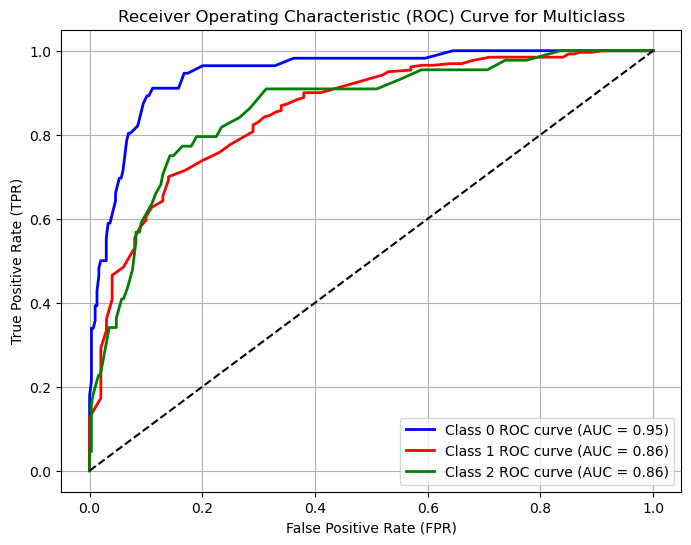

In [196]:
from sklearn.preprocessing import label_binarize

# Assuming y_test contains the true labels and LR is your fitted Logistic Regression model

# Binarize the labels for multi-class ROC curve
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))

# Predict probabilities for each class
y_test_pred_proba = rf.predict_proba(x_test_pca)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

n_classes = y_test_binarized.shape[1]

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_test_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure(figsize=(8, 6))
colors = ['blue', 'red', 'green', 'orange', 'purple']  # Add more colors if more classes
labels = [f'Class {i} ROC curve (AUC = {roc_auc[i]:.2f})' for i in range(n_classes)]

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label=labels[i])

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve for Multiclass')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Insights :

### The Receiver Operating Characteristic (ROC) curve is a valuable tool in the field of machine learning and statistics, primarily used in binary and multiclass classification problems. Its importance lies in its ability to provide insights into the performance of classification models and their ability to discriminate between classes


# Hyperparameter Tuning Of Decision Tree'

In [197]:
param_grid = {
    'n_estimators': [100, 200],           # Number of trees in the forest
    'max_depth': [None, 10],              # Maximum depth of the trees
    'min_samples_split': [2, 5],         # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2],          # Minimum number of samples required to be in a leaf node
    'bootstrap': [True, False]
}
rfh = RandomForestClassifier()
rfh_cv = GridSearchCV(estimator=rfh, scoring='accuracy',param_grid=param_grid, cv=3)
rfh_cv.fit(x_train_pca, y_train)
rfh_best_params = rfh_cv.best_params_   ##it will give you best parameters 
print(f"Best paramters: {rfh_best_params})")   ##printing  best parameters
rfh=RandomForestClassifier(**rfh_best_params)
rfh.fit(x_train_pca,y_train)
rfhp_test=rfh.predict(x_test_pca)
confusion=confusion_matrix(y_test,rfhp_test)
confusion

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix

param_grid = {
    'n_estimators': [100, 200],           # Number of trees in the forest
    'max_depth': [None, 10],              # Maximum depth of the trees
    'min_samples_split': [2, 5],          # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2],           # Minimum number of samples required to be in a leaf node
    'bootstrap': [True, False]
}




Best paramters: {'bootstrap': False, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100})


In [198]:
rfh = RandomForestClassifier()



In [199]:
# Use GridSearchCV to find the best parameters
rfh_cv = GridSearchCV(estimator=rfh, scoring='accuracy', param_grid=param_grid, cv=3)
rfh_cv.fit(x_train_pca, y_train)
rfh_best_params = rfh_cv.best_params_   # Get the best parameters
print(f"Best parameters: {rfh_best_params}")  # Print the best parameters



Best parameters: {'bootstrap': False, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}


In [200]:
# Train RandomForestClassifier using the best parameters
rfh = RandomForestClassifier(**rfh_best_params)
rfh.fit(x_train_pca, y_train)



RandomForestClassifier(bootstrap=False, min_samples_split=5)

In [201]:
rfhpre_test = rfh.predict(x_test_pca)


In [202]:
confusion = confusion_matrix(y_test, rfhpre_test, labels=np.unique(y_test), normalize='true')
confusion

array([[0.60714286, 0.39285714, 0.        ],
       [0.03846154, 0.93846154, 0.02307692],
       [0.02272727, 0.75      , 0.22727273]])

In [203]:
accuracy=accuracy_score(y_test,rfhpre_test)
accuracy


0.8

In [204]:
rfhpre_train=rfh.predict(x_train_pca)

In [205]:
accuracytr=accuracy_score(y_train,rfhpre_train)
accuracytr

1.0

In [206]:
f1=f1_score(y_test,rfhpre_test, average='weighted')
f1

0.7759621698603968

In [207]:
precision=precision_score(y_test,rfhpre_test, average='weighted')
precision

0.7832917337627483

In [208]:
print(classification_report(y_test,rfhpre_test))

              precision    recall  f1-score   support

           2       0.76      0.61      0.67        56
           3       0.82      0.94      0.87       260
           4       0.62      0.23      0.33        44

    accuracy                           0.80       360
   macro avg       0.73      0.59      0.63       360
weighted avg       0.78      0.80      0.78       360



# ROC Curve'

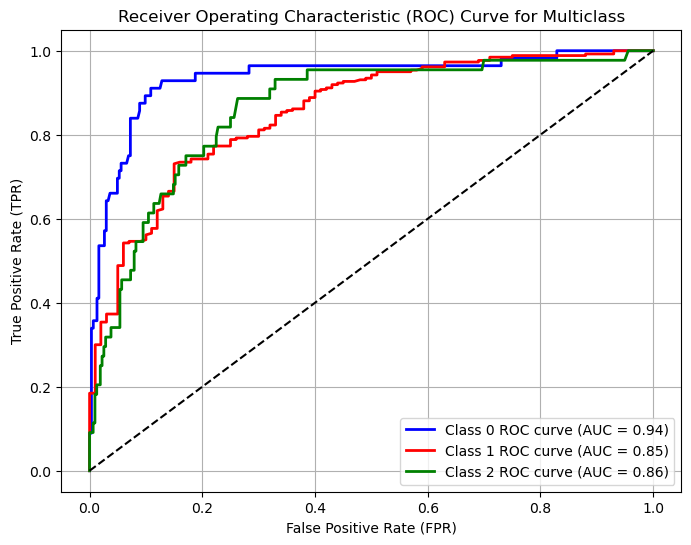

In [209]:
from sklearn.preprocessing import label_binarize

# Assuming y_test contains the true labels and LR is your fitted Logistic Regression model

# Binarize the labels for multi-class ROC curve
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))

# Predict probabilities for each class
y_test_pred_proba = rfh.predict_proba(x_test_pca)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

n_classes = y_test_binarized.shape[1]

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_test_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure(figsize=(8, 6))
colors = ['blue', 'red', 'green', 'orange', 'purple']  # Add more colors if more classes
labels = [f'Class {i} ROC curve (AUC = {roc_auc[i]:.2f})' for i in range(n_classes)]

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label=labels[i])

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve for Multiclass')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Insights :

### The Receiver Operating Characteristic (ROC) curve is a valuable tool in the field of machine learning and statistics, primarily used in binary and multiclass classification problems. Its importance lies in its ability to provide insights into the performance of classification models and their ability to discriminate between classes


# Gradient Boosting'

In [210]:
from sklearn.ensemble import GradientBoostingClassifier

In [211]:
gb=GradientBoostingClassifier(n_estimators=100,learning_rate=0.1,max_depth=3,random_state=42)

In [212]:
gb.fit(x_test_pca,y_test)

GradientBoostingClassifier(random_state=42)

In [213]:
gbpre_test=gb.predict(x_test_pca)
gbpre_train=gb.predict(x_train_pca)

In [214]:
confusion=confusion_matrix(y_test,gbpre_test , labels=np.unique(y_test), normalize='true')
confusion

array([[1., 0., 0.],
       [0., 1., 0.],
       [0., 0., 1.]])

In [215]:
accuracy=accuracy_score(y_test,gbpre_test)
accuracy

1.0

In [216]:
accuracytr=accuracy_score(y_train,gbpre_train)
accuracytr

0.5618892508143323

In [217]:
precision=precision_score(y_test,gbpre_test, average='weighted')
precision

1.0

In [218]:
f1=f1_score(y_test,gbpre_test, average='weighted')
f1

1.0

In [219]:
print(classification_report(y_test,gbpre_test))

              precision    recall  f1-score   support

           2       1.00      1.00      1.00        56
           3       1.00      1.00      1.00       260
           4       1.00      1.00      1.00        44

    accuracy                           1.00       360
   macro avg       1.00      1.00      1.00       360
weighted avg       1.00      1.00      1.00       360



# ROC Curve'

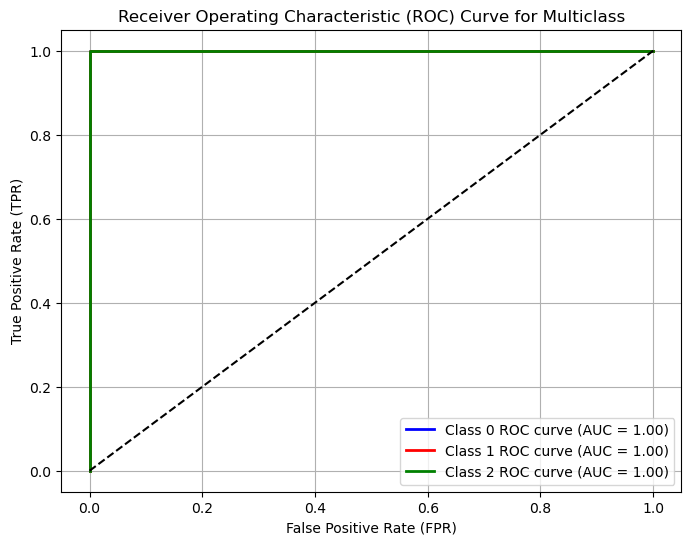

In [220]:
from sklearn.preprocessing import label_binarize

# Assuming y_test contains the true labels and LR is your fitted Logistic Regression model

# Binarize the labels for multi-class ROC curve
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))

# Predict probabilities for each class
y_test_pred_proba = gb.predict_proba(x_test_pca)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

n_classes = y_test_binarized.shape[1]

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_test_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure(figsize=(8, 6))
colors = ['blue', 'red', 'green', 'orange', 'purple']  # Add more colors if more classes
labels = [f'Class {i} ROC curve (AUC = {roc_auc[i]:.2f})' for i in range(n_classes)]

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label=labels[i])

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve for Multiclass')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Insights :

### The Receiver Operating Characteristic (ROC) curve is a valuable tool in the field of machine learning and statistics, primarily used in binary and multiclass classification problems. Its importance lies in its ability to provide insights into the performance of classification models and their ability to discriminate between classes


# Light Gradient Descent'

In [225]:
import lightgbm as lgb
clf=lgb.LGBMClassifier(
       boosting_type='gbdt',
       objective='multiclass',
       num_classes=3,
       num_leaves=31,
       learning_rate=0.05,
       feature_fraction=0.9,
       random_state=42)

In [226]:
clf.fit(x_train_pca,y_train)

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3825
[LightGBM] [Info] Number of data points in the train set: 1842, number of used features: 15
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


LGBMClassifier(feature_fraction=0.9, learning_rate=0.05, num_classes=3,
               objective='multiclass', random_state=42)

In [227]:
ylpre_test=clf.predict(x_test_pca)
ylpre_train=clf.predict(x_train_pca)

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


In [228]:
confusion=confusion_matrix(y_test,ylpre_test, labels=np.unique(y_test), normalize='true')
confusion

array([[0.75      , 0.23214286, 0.01785714],
       [0.04615385, 0.90384615, 0.05      ],
       [0.04545455, 0.54545455, 0.40909091]])

In [229]:
accuracy=accuracy_score(y_test,ylpre_test)
accuracy

0.8194444444444444

In [230]:
accuracytr=accuracy_score(y_train,ylpre_train)
accuracy

0.8194444444444444

In [231]:
precision=precision_score(y_test,ylpre_test, average='weighted')
precision

0.8093954248366013

In [232]:
f1=f1_score(y_test,ylpre_test, average='weighted')
f1

0.8126148705096075

In [233]:
print(classification_report(y_test,ylpre_test))

              precision    recall  f1-score   support

           2       0.75      0.75      0.75        56
           3       0.86      0.90      0.88       260
           4       0.56      0.41      0.47        44

    accuracy                           0.82       360
   macro avg       0.73      0.69      0.70       360
weighted avg       0.81      0.82      0.81       360



# ROC Curve'

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


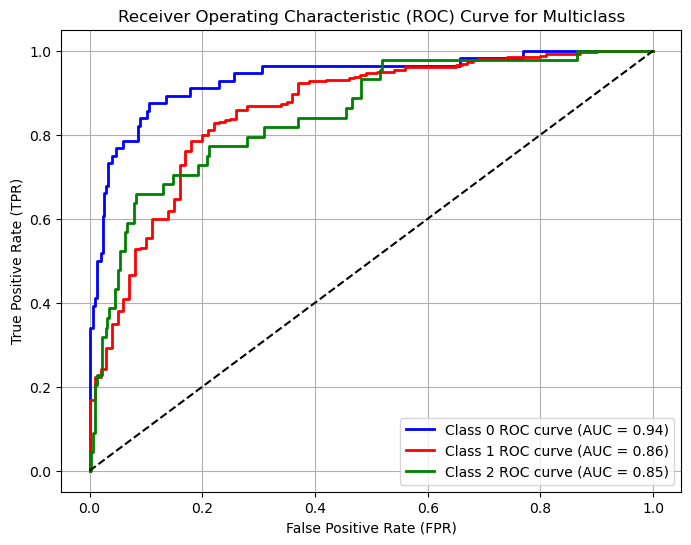

In [234]:
from sklearn.preprocessing import label_binarize

# Assuming y_test contains the true labels and LR is your fitted Logistic Regression model

# Binarize the labels for multi-class ROC curve
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))

# Predict probabilities for each class
y_test_pred_proba = clf.predict_proba(x_test_pca)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

n_classes = y_test_binarized.shape[1]

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_test_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure(figsize=(8, 6))
colors = ['blue', 'red', 'green', 'orange', 'purple']  # Add more colors if more classes
labels = [f'Class {i} ROC curve (AUC = {roc_auc[i]:.2f})' for i in range(n_classes)]

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label=labels[i])

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve for Multiclass')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Insights :

### The Receiver Operating Characteristic (ROC) curve is a valuable tool in the field of machine learning and statistics, primarily used in binary and multiclass classification problems. Its importance lies in its ability to provide insights into the performance of classification models and their ability to discriminate between classes


# Model Comparison Report'

In [235]:
from sklearn.model_selection import cross_validate
from sklearn.metrics import make_scorer


In [242]:
models = {
    'Logistic Regression': LogisticRegression(),
    'Decision Tree': DecisionTreeClassifier(max_depth=None, random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'GradientBoostingCl': GradientBoostingClassifier(random_state=42)
}


scoring = {
    'Accuracy': 'accuracy',
    'Precision': 'precision_macro',
    'Recall': 'recall_macro',
    'F1 Score': 'f1_macro'
}

In [243]:
results_train = {}
for model_name, model in models.items():
    cv_results = cross_validate(model, x_train_pca, y_train, cv=5, scoring=scoring)
    results_train[model_name] = {
        metric: cv_results[f'test_{metric}'].mean() for metric in scoring
    }
Models_df_train = pd.DataFrame(results_train).T
print("Train Dataset Results:")
print(Models_df_train)

Train Dataset Results:
                     Accuracy  Precision    Recall  F1 Score
Logistic Regression  0.856148   0.855564  0.856155  0.854135
Decision Tree        0.848543   0.849550  0.848532  0.846239
Random Forest        0.953860   0.955167  0.953850  0.953323
GradientBoostingCl   0.918584   0.921020  0.918557  0.917166


In [245]:
results_test = {}
for model_name, model in models.items():
    cv_results = cross_validate(model, x_test_pca, y_test, cv=5, scoring=scoring)
    results_test[model_name] = {
        metric: cv_results[f'test_{metric}'].mean() for metric in scoring
    }
Models_df_test = pd.DataFrame(results_test).T
print("\nTest Dataset Results:")
print(Models_df_test)


Test Dataset Results:
                     Accuracy  Precision    Recall  F1 Score
Logistic Regression  0.813889   0.757302  0.668913  0.696311
Decision Tree        0.613889   0.439368  0.434706  0.431941
Random Forest        0.758333   0.637052  0.433424  0.441302
GradientBoostingCl   0.763889   0.650835  0.516233  0.540344


In [246]:
difference = Models_df_test - Models_df_train
print("\nDifference between Train and Test Dataset Results:")
print(difference)


Difference between Train and Test Dataset Results:
                     Accuracy  Precision    Recall  F1 Score
Logistic Regression -0.042259  -0.098262 -0.187242 -0.157824
Decision Tree       -0.234654  -0.410182 -0.413826 -0.414298
Random Forest       -0.195527  -0.318115 -0.520426 -0.512021
GradientBoostingCl  -0.154695  -0.270185 -0.402324 -0.376822


# Hyperparameter Tuning'

In [247]:
from sklearn.model_selection import GridSearchCV

param_grids = {
    'Logistic Regression': {'C': [0.1, 1, 10]},
    'Decision Tree': {'max_depth': [None, 5, 10, 20]},
    'Random Forest': {'n_estimators': [50, 100, 200], 'max_depth': [None, 5, 10]},
    'GradientBoostingCl': {'n_estimators': [50, 100, 200], 'max_depth': [3, 5, 7]}
}

best_params_train = {}
for model_name, model in models.items():
    grid_search = GridSearchCV(estimator=model, param_grid=param_grids[model_name], scoring='accuracy', cv=5)
    grid_search.fit(x_train_pca, y_train)
    best_params_train[model_name] = grid_search.best_params_

tuned_models_train = {name: model.set_params(**params) for name, model, params in zip(models.keys(), models.values(), best_params_train.values())}

results_train_tuned = {}
for model_name, model in tuned_models_train.items():
    cv_results = cross_validate(model, x_train_pca, y_train, cv=5, scoring=scoring)
    results_train_tuned[model_name] = {
        metric: cv_results[f'test_{metric}'].mean() for metric in scoring
    }

results_test_tuned = {}
for model_name, model in tuned_models_train.items():
    cv_results = cross_validate(model, x_test_pca, y_test, cv=5, scoring=scoring)
    results_test_tuned[model_name] = {
        metric: cv_results[f'test_{metric}'].mean() for metric in scoring
    }

Models_df_train_tuned = pd.DataFrame(results_train_tuned).T
Models_df_test_tuned = pd.DataFrame(results_test_tuned).T

print("Train Dataset Results for Tuned Models:")
print(Models_df_train_tuned)

print("\nTest Dataset Results for Tuned Models:")
print(Models_df_test_tuned)

difference_tuned = Models_df_test_tuned - Models_df_train_tuned
print("\nDifference between Train and Test Dataset Results for Tuned Models:")
print(difference_tuned)


Train Dataset Results for Tuned Models:
                     Accuracy  Precision    Recall  F1 Score
Logistic Regression  0.856149   0.855525  0.856155  0.854170
Decision Tree        0.851243   0.851728  0.851228  0.848890
Random Forest        0.957115   0.958286  0.957106  0.956689
GradientBoostingCl   0.948434   0.950273  0.948430  0.947699

Test Dataset Results for Tuned Models:
                     Accuracy  Precision    Recall  F1 Score
Logistic Regression  0.805556   0.739941  0.675971  0.693529
Decision Tree        0.611111   0.426702  0.416395  0.413215
Random Forest        0.758333   0.579903  0.427299  0.429813
GradientBoostingCl   0.736111   0.563150  0.491077  0.503170

Difference between Train and Test Dataset Results for Tuned Models:
                     Accuracy  Precision    Recall  F1 Score
Logistic Regression -0.050594  -0.115584 -0.180184 -0.160641
Decision Tree       -0.240132  -0.425026 -0.434834 -0.435676
Random Forest       -0.198782  -0.378382 -0.529807 -0.5268